# Ecommerce Data Analysis
# Part1. Data Preparation

- Data Source: Us-Ecommerce Dataset
- Data Source: https://www.kaggle.com/datasets/roopeshbharatwajkr/ecommerce-dataset?select=Us-Ecommerce+Dataset.csv
- Goal: Explore Ecommerce data, identify factors influencing sales, and forecast future sales.
- Skills: Data Preparation, Exploratory Data Analysis (EDA)
- Author: Mia Song

# 0. Meta Data (DataSet Description)
- Transaction Id : Transaction ID Number.
- Customer_ Id : ID Number of Customers.
- Date : Trasaction Date.
- Product : Product Details.
- Gender : Male and Female.
- Device_Type : Shopped by Web or Mobile.
- Country : Country Name
- State : State Name
- City : City Name
- Category : shopping Category
- CustomerLoginType : Customer Online Info
- Delivery_Type Quantity : Delivery Info
- Transaction Start : Transaction Info
- Transaction_Result : Transaction Info
- Amount US currency : Cost of the Product in US Dollars.
- IndividualPriceUScurrency : Individual Prices in US Dollars.
- Year_Month : Year & Monthvise Transaction.
- Time : Transaction Timing.

# 1. Import Necessary Libaries

In [1]:
import pandas as pd
import numpy as np

# 2. Import Data

In [2]:
df_raw = pd.read_csv('Us-Ecommerce Dataset.csv')

In [3]:
df = df_raw.copy()

# 3. Data Preparation / Handling

In [4]:
df.shape

(65535, 19)

In [5]:
df.columns # column name ' Quantity ' contains blank in front of and at the end of it

Index(['Transaction_id', 'customer_id', 'Date', 'Product', 'Gender',
       'Device_Type', 'Country', 'State', 'City', 'Category',
       'Customer_Login_type', 'Delivery_Type', ' Quantity ',
       'Transaction Start', 'Transaction_Result', 'Amount US$',
       'Individual_Price_US$', 'Year_Month', 'Time'],
      dtype='object')

In [6]:
df.columns = df.columns.str.replace(' ', '')

In [7]:
df.columns

Index(['Transaction_id', 'customer_id', 'Date', 'Product', 'Gender',
       'Device_Type', 'Country', 'State', 'City', 'Category',
       'Customer_Login_type', 'Delivery_Type', 'Quantity', 'TransactionStart',
       'Transaction_Result', 'AmountUS$', 'Individual_Price_US$', 'Year_Month',
       'Time'],
      dtype='object')

In [8]:
df.head()

,Transaction_id,customer_id,Date,Product,Gender,Device_Type,Country,State,City,Category,Customer_Login_type,Delivery_Type,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Year_Month,Time
0,40170,1348959766,14/11/2013,Hair Band,Female,Web,United States,New York,New York City,Accessories,Member,one-day deliver,12,1,0,"6,910",576,13-Nov,22:35:51
1,33374,2213674919,05/11/2013,Hair Band,Female,Web,United States,California,Los Angles,Accessories,Member,one-day deliver,17,1,1,"1,699",100,13-Nov,06:44:41
2,14407,1809450308,01/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,"4,998",217,13-Oct,00:41:24
3,15472,1691227134,04/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,736,32,13-Oct,22:04:03
4,18709,2290737237,12/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,1,"4,389",191,13-Oct,15:00:46


In [9]:
df.tail()

,Transaction_id,customer_id,Date,Product,Gender,Device_Type,Country,State,City,Category,Customer_Login_type,Delivery_Type,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Year_Month,Time
65530,67031,1266148699,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,20,1,1,"5,895",295,13-Dec,19:18:50
65531,67043,2282461907,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,16,1,0,299,19,13-Dec,18:18:05
65532,67045,1367012613,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,23,1,0,"21,990",956,13-Dec,20:13:22
65533,67150,1192845373,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,22,1,0,"8,680",395,13-Dec,10:39:28
65534,67181,2063357887,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,16,1,1,"30,901","1,931",13-Dec,15:23:35


In [10]:
df.duplicated().sum()

0

## 3.1. Managing Null Values

- One null value in the Amount US$ (65,534 / 65,535)
- The number of null values is insignificant (1), so remove it.

In [11]:
df.info() # Check null values and data types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65535 entries, 0 to 65534
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Transaction_id        65535 non-null  int64 
 1   customer_id           65535 non-null  int64 
 2   Date                  65535 non-null  object
 3   Product               65535 non-null  object
 4   Gender                65535 non-null  object
 5   Device_Type           65535 non-null  object
 6   Country               65535 non-null  object
 7   State                 65535 non-null  object
 8   City                  65535 non-null  object
 9   Category              65535 non-null  object
 10  Customer_Login_type   65535 non-null  object
 11  Delivery_Type         65535 non-null  object
 12  Quantity              65535 non-null  int64 
 13  TransactionStart      65535 non-null  int64 
 14  Transaction_Result    65535 non-null  int64 
 15  AmountUS$             65534 non-null

In [12]:
df = df[df['AmountUS$'].notnull()]

In [13]:
df.shape

(65534, 19)

## 3.2. Managing Data Types

- 'Transaction_id' and 'customer_id' are not continuous numerical values but unique identifiers.

In [14]:
df[['Transaction_id', 'customer_id']] = df[['Transaction_id', 'customer_id']].astype('object')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65534 entries, 0 to 65534
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Transaction_id        65534 non-null  object
 1   customer_id           65534 non-null  object
 2   Date                  65534 non-null  object
 3   Product               65534 non-null  object
 4   Gender                65534 non-null  object
 5   Device_Type           65534 non-null  object
 6   Country               65534 non-null  object
 7   State                 65534 non-null  object
 8   City                  65534 non-null  object
 9   Category              65534 non-null  object
 10  Customer_Login_type   65534 non-null  object
 11  Delivery_Type         65534 non-null  object
 12  Quantity              65534 non-null  int64 
 13  TransactionStart      65534 non-null  int64 
 14  Transaction_Result    65534 non-null  int64 
 15  AmountUS$             65534 non-null

- Change 'Date' and 'Time' into datetime if necessary.

In [16]:
pd.to_datetime(df['Date'], format = '%d/%m/%Y')

0       2013-11-14
1       2013-11-05
2       2013-10-01
3       2013-10-04
4       2013-10-12
           ...    
65530   2013-12-13
65531   2013-12-13
65532   2013-12-13
65533   2013-12-13
65534   2013-12-13
Name: Date, Length: 65534, dtype: datetime64[ns]

- 'TransactionStart', 'Transaction_Result' are represented as integers, but they are binary values to indicate failure or success.
- They are not continuous, numerical values and convert them as object.

In [17]:
df[['TransactionStart', 'Transaction_Result']] = df[['TransactionStart', 'Transaction_Result']].astype('object')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65534 entries, 0 to 65534
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Transaction_id        65534 non-null  object
 1   customer_id           65534 non-null  object
 2   Date                  65534 non-null  object
 3   Product               65534 non-null  object
 4   Gender                65534 non-null  object
 5   Device_Type           65534 non-null  object
 6   Country               65534 non-null  object
 7   State                 65534 non-null  object
 8   City                  65534 non-null  object
 9   Category              65534 non-null  object
 10  Customer_Login_type   65534 non-null  object
 11  Delivery_Type         65534 non-null  object
 12  Quantity              65534 non-null  int64 
 13  TransactionStart      65534 non-null  object
 14  Transaction_Result    65534 non-null  object
 15  AmountUS$             65534 non-null

- 'AmountUS$', 'Individual_Price_US$' are continuous, and numerical values which allows statistical analysis possible.

In [19]:
# df[['AmountUS$', 'Individual_Price_US$']].astype('int64')
# However, this first return error as ValueError: invalid literal for int() with base 10: '6,910'.
# Remove commas.

In [20]:
df['AmountUS$'].str.replace(',', '')

0         6910
1         1699
2         4998
3          736
4         4389
         ...  
65530     5895
65531      299
65532    21990
65533     8680
65534    30901
Name: AmountUS$, Length: 65534, dtype: object

In [21]:
def remove_comma(df, col_name):
    df[col_name] = df[col_name].str.replace(',','')

In [22]:
remove_comma(df, 'AmountUS$')

In [23]:
remove_comma(df, 'Individual_Price_US$')

In [24]:
df['AmountUS$']

0         6910
1         1699
2         4998
3          736
4         4389
         ...  
65530     5895
65531      299
65532    21990
65533     8680
65534    30901
Name: AmountUS$, Length: 65534, dtype: object

In [25]:
df['Individual_Price_US$']

0         576
1         100
2         217
3          32
4         191
         ... 
65530     295
65531      19
65532     956
65533     395
65534    1931
Name: Individual_Price_US$, Length: 65534, dtype: object

In [26]:
# df[['AmountUS$', 'Individual_Price_US$']].astype('int64')
# After removing commas, this still return error as below
# ValueError: invalid literal for int() with base 10: '#VALUE!'

In [27]:
(df['AmountUS$'] == '#VALUE!').sum()

0

- 'Individual_Price_US$' contains non-numerical values in the column and has caused error and can't be converted into int64 data type. 
- Only 0.002% of the values are abnormal, so remove those values.

In [28]:
(df['Individual_Price_US$'] == '#VALUE!').sum() # 'Individual_Price_US$' has contributed to the error.

159

In [29]:
df = df[df['Individual_Price_US$'] != '#VALUE!']

In [30]:
df[['AmountUS$', 'Individual_Price_US$']] = df[['AmountUS$', 'Individual_Price_US$']].astype('int64')

- By converting 'AmountUS$', 'Individual_Price_US$' into int64, managing data type has been done.

In [31]:
df.dtypes

Transaction_id          object
customer_id             object
Date                    object
Product                 object
Gender                  object
Device_Type             object
Country                 object
State                   object
City                    object
Category                object
Customer_Login_type     object
Delivery_Type           object
Quantity                 int64
TransactionStart        object
Transaction_Result      object
AmountUS$                int64
Individual_Price_US$     int64
Year_Month              object
Time                    object
dtype: object

## 3.3. Creaet New Columns (with Insights)
### 3.3.1. Day, Month, Year & Time

In [32]:
df.reset_index(drop = True, inplace = True)

In [33]:
df = df.copy()

In [34]:
df.head()

,Transaction_id,customer_id,Date,Product,Gender,Device_Type,Country,State,City,Category,Customer_Login_type,Delivery_Type,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Year_Month,Time
0,40170,1348959766,14/11/2013,Hair Band,Female,Web,United States,New York,New York City,Accessories,Member,one-day deliver,12,1,0,6910,576,13-Nov,22:35:51
1,33374,2213674919,05/11/2013,Hair Band,Female,Web,United States,California,Los Angles,Accessories,Member,one-day deliver,17,1,1,1699,100,13-Nov,06:44:41
2,14407,1809450308,01/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,4998,217,13-Oct,00:41:24
3,15472,1691227134,04/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,736,32,13-Oct,22:04:03
4,18709,2290737237,12/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,1,4389,191,13-Oct,15:00:46


In [35]:
date_split = df['Date'].str.split('/', expand = True)
date_split

,0,1,2
0,14,11,2013
1,05,11,2013
2,01,10,2013
3,04,10,2013
4,12,10,2013
...,...,...,...
65370,13,12,2013
65371,13,12,2013
65372,13,12,2013
65373,13,12,2013


In [36]:
date_split.columns = ['day', 'month', 'year']

In [37]:
date_split

,day,month,year
0,14,11,2013
1,05,11,2013
2,01,10,2013
3,04,10,2013
4,12,10,2013
...,...,...,...
65370,13,12,2013
65371,13,12,2013
65372,13,12,2013
65373,13,12,2013


In [38]:
df = pd.concat([df, date_split], axis = 1)

In [39]:
pd.set_option('display.max_columns', None)

In [40]:
df

,Transaction_id,customer_id,Date,Product,Gender,Device_Type,Country,State,City,Category,Customer_Login_type,Delivery_Type,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Year_Month,Time,day,month,year
0,40170,1348959766,14/11/2013,Hair Band,Female,Web,United States,New York,New York City,Accessories,Member,one-day deliver,12,1,0,6910,576,13-Nov,22:35:51,14,11,2013
1,33374,2213674919,05/11/2013,Hair Band,Female,Web,United States,California,Los Angles,Accessories,Member,one-day deliver,17,1,1,1699,100,13-Nov,06:44:41,05,11,2013
2,14407,1809450308,01/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,4998,217,13-Oct,00:41:24,01,10,2013
3,15472,1691227134,04/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,736,32,13-Oct,22:04:03,04,10,2013
4,18709,2290737237,12/10/2013,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,1,4389,191,13-Oct,15:00:46,12,10,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65370,67031,1266148699,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,20,1,1,5895,295,13-Dec,19:18:50,13,12,2013
65371,67043,2282461907,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,16,1,0,299,19,13-Dec,18:18:05,13,12,2013
65372,67045,1367012613,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,23,1,0,21990,956,13-Dec,20:13:22,13,12,2013
65373,67150,1192845373,13/12/2013,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,22,1,0,8680,395,13-Dec,10:39:28,13,12,2013


- Successfully added year, month, day and therefore removed Year_Month column.

In [41]:
df = df.drop(['Date', 'Year_Month'], axis = 1)

In [42]:
df.columns

Index(['Transaction_id', 'customer_id', 'Product', 'Gender', 'Device_Type',
       'Country', 'State', 'City', 'Category', 'Customer_Login_type',
       'Delivery_Type', 'Quantity', 'TransactionStart', 'Transaction_Result',
       'AmountUS$', 'Individual_Price_US$', 'Time', 'day', 'month', 'year'],
      dtype='object')

- Also, create column for transaction time but this time we do not need min and sec information. 
- Therefore, extract the first two strings from the time column.

In [43]:
df['Time'] = df['Time'].str[0:2]

In [44]:
df['Time']

0        22
1        06
2        00
3        22
4        15
         ..
65370    19
65371    18
65372    20
65373    10
65374    15
Name: Time, Length: 65375, dtype: object

In [45]:
df

,Transaction_id,customer_id,Product,Gender,Device_Type,Country,State,City,Category,Customer_Login_type,Delivery_Type,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year
0,40170,1348959766,Hair Band,Female,Web,United States,New York,New York City,Accessories,Member,one-day deliver,12,1,0,6910,576,22,14,11,2013
1,33374,2213674919,Hair Band,Female,Web,United States,California,Los Angles,Accessories,Member,one-day deliver,17,1,1,1699,100,06,05,11,2013
2,14407,1809450308,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,4998,217,00,01,10,2013
3,15472,1691227134,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,0,736,32,22,04,10,2013
4,18709,2290737237,Hair Band,Female,Web,United States,Washington,Seattle,Accessories,Member,Normal Delivery,23,1,1,4389,191,15,12,10,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65370,67031,1266148699,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,20,1,1,5895,295,19,13,12,2013
65371,67043,2282461907,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,16,1,0,299,19,18,13,12,2013
65372,67045,1367012613,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,23,1,0,21990,956,20,13,12,2013
65373,67150,1192845373,Shoes,Female,Mobile,United States,Washington,Seattle,wearables,Member,Normal Delivery,22,1,0,8680,395,10,13,12,2013


### 3.3.2. Convert to Binary Values for One-hot encoding 

In [46]:
df['Gender'].value_counts(ascending = True)

Female    28159
Male      37216
Name: Gender, dtype: int64

In [47]:
df['Gender'] = np.where(df['Gender'] == 'Female', 1, 0)

In [48]:
df.rename(columns = {'Gender':'is_female'}, inplace = True)

In [49]:
df['Device_Type'].value_counts(ascending = True)

Mobile    12508
Web       52867
Name: Device_Type, dtype: int64

In [50]:
df['Device_Type'] = np.where(df['Device_Type'] == 'Mobile', 1, 0)

In [51]:
df.rename(columns = {'Device_Type':'is_mobile'}, inplace = True)

In [52]:
df['Delivery_Type'].value_counts(ascending = True)

Normal Delivery    32145
one-day deliver    33230
Name: Delivery_Type, dtype: int64

In [53]:
df['Delivery_Type'] = np.where(df['Delivery_Type'] == 'one-day deliver', 1, 0)

In [54]:
df.rename(columns = {'Delivery_Type':'is_express'}, inplace = True)

In [55]:
df.columns

Index(['Transaction_id', 'customer_id', 'Product', 'is_female', 'is_mobile',
       'Country', 'State', 'City', 'Category', 'Customer_Login_type',
       'is_express', 'Quantity', 'TransactionStart', 'Transaction_Result',
       'AmountUS$', 'Individual_Price_US$', 'Time', 'day', 'month', 'year'],
      dtype='object')

### 3.3.3. Binning for insights

#### 3.3.3.1. Region & Population

In [56]:
df['State'].value_counts(ascending = False)

Washington    39725
California    22852
New York       2798
Name: State, dtype: int64

In [57]:
state_regions = {
    'Washington': 'West',
    'California': 'West',
    'New York': 'East'
}

In [58]:
df['Region'] = df['State'].map(state_regions)

In [59]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,Category,Customer_Login_type,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,Accessories,Member,1,12,1,0,6910,576,22,14,11,2013,East
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angles,Accessories,Member,1,17,1,1,1699,100,06,05,11,2013,West
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,4998,217,00,01,10,2013,West
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,736,32,22,04,10,2013,West
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,1,4389,191,15,12,10,2013,West


In [60]:
df['City'].value_counts(ascending = False)

Seattle          39725
Los Angles       22852
New York City     2798
Name: City, dtype: int64

In [61]:
df['City'] = np.where(df['City'] == 'Los Angles', 'Los Angeles', df['City'])

In [62]:
city_populations = {
    'Seattle': 769714,
    'Los Angeles': 3898747,
    'New York City': 8804190
}

In [63]:
df['population'] = df['City'].map(city_populations)

In [64]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,Category,Customer_Login_type,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,Accessories,Member,1,12,1,0,6910,576,22,14,11,2013,East,8804190
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,Accessories,Member,1,17,1,1,1699,100,06,05,11,2013,West,3898747
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,4998,217,00,01,10,2013,West,769714
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,736,32,22,04,10,2013,West,769714
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,1,4389,191,15,12,10,2013,West,769714


#### 3.3.3.2. Category (reCategory)

In [65]:
df['Category'].value_counts(ascending = False)

Fashion         31241
Clothing        23743
wearables        4739
stationaries     3810
Electronics      1773
Accessories        48
House hold         20
Vehicle             1
Name: Category, dtype: int64

In [66]:
pd.crosstab(df['Category'], df['Product'])

Product,Bag,Books,Cycle,Fairness Cream,Hair Band,Jean,Pen Drive,Shirt,Shoes,spectacles,vessels,watNew York Citys
Category,,,,,,,,,,,,
Accessories,0,0,0,0,48,0,0,0,0,0,0,0
Clothing,0,0,0,0,0,7216,0,16527,0,0,0,0
Electronics,0,0,0,0,0,0,11,0,0,0,0,1762
Fashion,2185,0,0,23464,0,0,0,0,0,5592,0,0
House hold,0,0,0,0,0,0,0,0,0,0,20,0
Vehicle,0,0,1,0,0,0,0,0,0,0,0,0
stationaries,0,3810,0,0,0,0,0,0,0,0,0,0
wearables,0,0,0,0,0,0,0,0,4739,0,0,0


In [67]:
df['Product'].unique()

array(['Hair Band', 'Jean', 'Shirt', 'watNew York Citys', 'Pen Drive',
       'spectacles', 'Fairness Cream', 'Bag', 'vessels', 'Books', 'Cycle',
       'Shoes'], dtype=object)

In [68]:
category_re = {
    'Hair Band':'accessories', 
    'Jean':'clothing', 
    'Shirt':'clothing', 
    'watNew York Citys':'electronics', 
    'Pen Drive':'electronics',
    'spectacles':'accessories', 
    'Fairness Cream':'cosmetics',
    'Bag':'accessories', 
    'vessels':'household', 
    'Books':'books', 
    'Cycle':'vehicle',
    'Shoes':'clothing'
}

In [69]:
df['cat_group'] = df['Product'].map(category_re)

In [70]:
fashion_cat = ['accessories', 'clothing']

In [71]:
df['is_fashion'] = np.where(df['cat_group'].isin(fashion_cat), 1, 0)

In [72]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,Category,Customer_Login_type,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,Accessories,Member,1,12,1,0,6910,576,22,14,11,2013,East,8804190,accessories,1
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,Accessories,Member,1,17,1,1,1699,100,06,05,11,2013,West,3898747,accessories,1
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,4998,217,00,01,10,2013,West,769714,accessories,1
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,0,736,32,22,04,10,2013,West,769714,accessories,1
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,Accessories,Member,0,23,1,1,4389,191,15,12,10,2013,West,769714,accessories,1


In [73]:
df = df.drop(['Category'], axis = 1)

In [74]:
df.columns

Index(['Transaction_id', 'customer_id', 'Product', 'is_female', 'is_mobile',
       'Country', 'State', 'City', 'Customer_Login_type', 'is_express',
       'Quantity', 'TransactionStart', 'Transaction_Result', 'AmountUS$',
       'Individual_Price_US$', 'Time', 'day', 'month', 'year', 'Region',
       'population', 'cat_group', 'is_fashion'],
      dtype='object')

#### 3.3.3.4. Cutomer Information (member class, purchase($) and order(#) amount.)

In [75]:
df['Customer_Login_type'].value_counts(ascending = True)

New                36
First SignUp      187
Guest            2313
Member          62839
Name: Customer_Login_type, dtype: int64

In [76]:
member_grade = {
    'New':'member_new',
    'First SignUp':'member_new',
    'Guest':'guest',
    'Member':'member_old'
}

In [77]:
df['member_class'] = df['Customer_Login_type'].map(member_grade)

In [78]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,Customer_Login_type,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion,member_class
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,Member,1,12,1,0,6910,576,22,14,11,2013,East,8804190,accessories,1,member_old
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,Member,1,17,1,1,1699,100,06,05,11,2013,West,3898747,accessories,1,member_old
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,Member,0,23,1,0,4998,217,00,01,10,2013,West,769714,accessories,1,member_old
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,Member,0,23,1,0,736,32,22,04,10,2013,West,769714,accessories,1,member_old
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,Member,0,23,1,1,4389,191,15,12,10,2013,West,769714,accessories,1,member_old


In [79]:
df = df.drop(['Customer_Login_type'], axis = 1)

In [80]:
df.columns

Index(['Transaction_id', 'customer_id', 'Product', 'is_female', 'is_mobile',
       'Country', 'State', 'City', 'is_express', 'Quantity',
       'TransactionStart', 'Transaction_Result', 'AmountUS$',
       'Individual_Price_US$', 'Time', 'day', 'month', 'year', 'Region',
       'population', 'cat_group', 'is_fashion', 'member_class'],
      dtype='object')

In [81]:
df['member_class'].value_counts(ascending = True)

member_new      187
guest          2313
member_old    62839
Name: member_class, dtype: int64

In [82]:
df['is_new'] = np.where(df['member_class'] == 'member_new', 1, 0)

In [83]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion,member_class,is_new
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,1,12,1,0,6910,576,22,14,11,2013,East,8804190,accessories,1,member_old,0
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,1,17,1,1,1699,100,06,05,11,2013,West,3898747,accessories,1,member_old,0
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,4998,217,00,01,10,2013,West,769714,accessories,1,member_old,0
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,736,32,22,04,10,2013,West,769714,accessories,1,member_old,0
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,0,23,1,1,4389,191,15,12,10,2013,West,769714,accessories,1,member_old,0


In [84]:
df['customer_id'].duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
65370    False
65371    False
65372    False
65373    False
65374    False
Name: customer_id, Length: 65375, dtype: bool

In [85]:
df['is_return'] = np.where(df['customer_id'].duplicated(), 1, 0)

In [86]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion,member_class,is_new,is_return
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,1,12,1,0,6910,576,22,14,11,2013,East,8804190,accessories,1,member_old,0,0
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,1,17,1,1,1699,100,06,05,11,2013,West,3898747,accessories,1,member_old,0,0
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,4998,217,00,01,10,2013,West,769714,accessories,1,member_old,0,0
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,736,32,22,04,10,2013,West,769714,accessories,1,member_old,0,0
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,0,23,1,1,4389,191,15,12,10,2013,West,769714,accessories,1,member_old,0,0


In [87]:
df['customer_id'].value_counts(ascending = True)

1348959766     1
1345541999     1
1596765963     1
1335883439     1
2004131168     1
              ..
2107762211     5
2234965006    13
2009627249    22
2183969878    44
1661266404    47
Name: customer_id, Length: 64843, dtype: int64

In [88]:
sales_sum = df.groupby('customer_id')['AmountUS$'].sum()

In [89]:
df['purchase_total'] = df['customer_id'].map(sales_sum) # purchase_total means the total amount of purchase of one customer in USD.

In [90]:
df[df['customer_id'] == 2234965006]

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion,member_class,is_new,is_return,purchase_total
40169,20621,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1999,167,13,16,10,2013,West,769714,accessories,1,member_old,0,0,45642
40469,21358,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,350,29,21,17,10,2013,West,769714,accessories,1,member_old,0,1,45642
40767,22131,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,13397,1116,03,18,10,2013,West,769714,accessories,1,member_old,0,1,45642
44070,30840,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1500,125,08,01,11,2013,West,769714,accessories,1,member_old,0,1,45642
45059,33228,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,2799,233,07,05,11,2013,West,769714,accessories,1,member_old,0,1,45642
45963,35505,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,9022,752,18,08,11,2013,West,769714,accessories,1,member_old,0,1,45642
47338,39503,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,0,0,00,13,11,2013,West,769714,accessories,1,member_old,0,1,45642
47452,39791,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1794,150,06,14,11,2013,West,769714,accessories,1,member_old,0,1,45642
47516,39963,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,5614,468,19,14,11,2013,West,769714,accessories,1,member_old,0,1,45642
47575,40130,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,3700,308,06,14,11,2013,West,769714,accessories,1,member_old,0,1,45642


In [91]:
order_sum = df['customer_id'].value_counts()

In [92]:
order_sum

1661266404    47
2183969878    44
2009627249    22
2234965006    13
1762402333     5
              ..
1802701639     1
1946594857     1
1342630724     1
2244414738     1
2063357887     1
Name: customer_id, Length: 64843, dtype: int64

In [93]:
df['order_total'] = df['customer_id'].map(order_sum)

In [94]:
df[df['customer_id'] == 2234965006]

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,Time,day,month,year,Region,population,cat_group,is_fashion,member_class,is_new,is_return,purchase_total,order_total
40169,20621,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1999,167,13,16,10,2013,West,769714,accessories,1,member_old,0,0,45642,13
40469,21358,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,350,29,21,17,10,2013,West,769714,accessories,1,member_old,0,1,45642,13
40767,22131,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,13397,1116,03,18,10,2013,West,769714,accessories,1,member_old,0,1,45642,13
44070,30840,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1500,125,08,01,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
45059,33228,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,2799,233,07,05,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
45963,35505,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,9022,752,18,08,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
47338,39503,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,0,0,00,13,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
47452,39791,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,1794,150,06,14,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
47516,39963,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,5614,468,19,14,11,2013,West,769714,accessories,1,member_old,0,1,45642,13
47575,40130,2234965006,Bag,1,1,United States,Washington,Seattle,0,12,1,0,3700,308,06,14,11,2013,West,769714,accessories,1,member_old,0,1,45642,13


#### 3.3.3.5. Segment Monthly(=Month Segmnet), Yearly(=Quarter)

In [95]:
df[['day', 'month', 'year']] = df[['day', 'month', 'year']].astype('int64')

In [96]:
q_bins = [0, 4, 7, 10, 13]
q_labels = ['1Q', '2Q','3Q', '4Q']

df['quarter'] = pd.cut(df['month'], bins = q_bins, labels = q_labels, right = False)

In [97]:
pd.crosstab(df['month'], df['quarter'])

quarter,1Q,3Q,4Q
month,,,
1,2996,0,0
9,0,4034,0
10,0,0,16522
11,0,0,22473
12,0,0,19350


In [98]:
d_bins = [0, 11, 21, 32]
d_labels = ['Beginning', 'Middle', 'End']

In [99]:
df['month_seg'] = pd.cut(df['day'], bins = d_bins, labels = d_labels, right = False)

In [100]:
pd.crosstab(df['day'], df['month_seg'])

month_seg,Beginning,Middle,End
day,,,
1,2658,0,0
2,2789,0,0
3,1660,0,0
4,2301,0,0
5,2131,0,0
6,2201,0,0
7,2283,0,0
8,2281,0,0
9,2065,0,0


In [101]:
df = df.drop(['day'], axis = 1)

In [102]:
df.columns

Index(['Transaction_id', 'customer_id', 'Product', 'is_female', 'is_mobile',
       'Country', 'State', 'City', 'is_express', 'Quantity',
       'TransactionStart', 'Transaction_Result', 'AmountUS$',
       'Individual_Price_US$', 'Time', 'month', 'year', 'Region', 'population',
       'cat_group', 'is_fashion', 'member_class', 'is_new', 'is_return',
       'purchase_total', 'order_total', 'quarter', 'month_seg'],
      dtype='object')

In [103]:
df.dtypes

Transaction_id            object
customer_id               object
Product                   object
is_female                  int64
is_mobile                  int64
Country                   object
State                     object
City                      object
is_express                 int64
Quantity                   int64
TransactionStart          object
Transaction_Result        object
AmountUS$                  int64
Individual_Price_US$       int64
Time                      object
month                      int64
year                       int64
Region                    object
population                 int64
cat_group                 object
is_fashion                 int64
member_class              object
is_new                     int64
is_return                  int64
purchase_total             int64
order_total                int64
quarter                 category
month_seg               category
dtype: object

In [104]:
df['Time'] = df['Time'].astype('int64')

In [105]:
# Night: 12:00 am - 6:00 am
# Morning: 6:00 am - 12:00 pm
# Afternoon: 12:00 pm - 6:00 pm
# Evening: 6:00 pm - 12:00 am (next day)
t_bins = [0, 6, 12, 18, 24]
t_labels = ['night', 'morning', 'afternoon', 'evening']

In [106]:
df['daytime'] = pd.cut(df['Time'], bins = t_bins, labels = t_labels, right = False)

In [107]:
pd.crosstab(df['daytime'], df['Time'])

Time,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
daytime,,,,,,,,,,,,,,,,,,,,,,,,
night,2757,2710,2700,2700,2707,2706,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
morning,0,0,0,0,0,0,2679,2726,2796,2777,2705,2680,0,0,0,0,0,0,0,0,0,0,0,0
afternoon,0,0,0,0,0,0,0,0,0,0,0,0,2740,2690,2778,2623,2704,2697,0,0,0,0,0,0
evening,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2686,2721,2757,2789,2782,2765


In [108]:
df = df.drop(['Time'], axis = 1)

In [109]:
df.head()

,Transaction_id,customer_id,Product,is_female,is_mobile,Country,State,City,is_express,Quantity,TransactionStart,Transaction_Result,AmountUS$,Individual_Price_US$,month,year,Region,population,cat_group,is_fashion,member_class,is_new,is_return,purchase_total,order_total,quarter,month_seg,daytime
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,1,12,1,0,6910,576,11,2013,East,8804190,accessories,1,member_old,0,0,6910,1,4Q,Middle,evening
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,1,17,1,1,1699,100,11,2013,West,3898747,accessories,1,member_old,0,0,1699,1,4Q,Beginning,morning
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,4998,217,10,2013,West,769714,accessories,1,member_old,0,0,4998,1,4Q,Beginning,night
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,736,32,10,2013,West,769714,accessories,1,member_old,0,0,736,1,4Q,Beginning,evening
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,0,23,1,1,4389,191,10,2013,West,769714,accessories,1,member_old,0,0,4389,1,4Q,Middle,afternoon


### 3.3.4. Change Cloumn Names

In [110]:
df.rename(columns = {'TransactionStart':'Transaction_Start', 'AmountUS$':'sales_usd', 'Individual_Price_US$':'price_usd'}, inplace = True)

In [111]:
df.columns = df.columns.str.lower()

In [112]:
df.columns

Index(['transaction_id', 'customer_id', 'product', 'is_female', 'is_mobile',
       'country', 'state', 'city', 'is_express', 'quantity',
       'transaction_start', 'transaction_result', 'sales_usd', 'price_usd',
       'month', 'year', 'region', 'population', 'cat_group', 'is_fashion',
       'member_class', 'is_new', 'is_return', 'purchase_total', 'order_total',
       'quarter', 'month_seg', 'daytime'],
      dtype='object')

# 4. Explanatory Data Analysis (EDA)

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

In [114]:
df.head()

,transaction_id,customer_id,product,is_female,is_mobile,country,state,city,is_express,quantity,transaction_start,transaction_result,sales_usd,price_usd,month,year,region,population,cat_group,is_fashion,member_class,is_new,is_return,purchase_total,order_total,quarter,month_seg,daytime
0,40170,1348959766,Hair Band,1,0,United States,New York,New York City,1,12,1,0,6910,576,11,2013,East,8804190,accessories,1,member_old,0,0,6910,1,4Q,Middle,evening
1,33374,2213674919,Hair Band,1,0,United States,California,Los Angeles,1,17,1,1,1699,100,11,2013,West,3898747,accessories,1,member_old,0,0,1699,1,4Q,Beginning,morning
2,14407,1809450308,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,4998,217,10,2013,West,769714,accessories,1,member_old,0,0,4998,1,4Q,Beginning,night
3,15472,1691227134,Hair Band,1,0,United States,Washington,Seattle,0,23,1,0,736,32,10,2013,West,769714,accessories,1,member_old,0,0,736,1,4Q,Beginning,evening
4,18709,2290737237,Hair Band,1,0,United States,Washington,Seattle,0,23,1,1,4389,191,10,2013,West,769714,accessories,1,member_old,0,0,4389,1,4Q,Middle,afternoon


In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65375 entries, 0 to 65374
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   transaction_id      65375 non-null  object  
 1   customer_id         65375 non-null  object  
 2   product             65375 non-null  object  
 3   is_female           65375 non-null  int64   
 4   is_mobile           65375 non-null  int64   
 5   country             65375 non-null  object  
 6   state               65375 non-null  object  
 7   city                65375 non-null  object  
 8   is_express          65375 non-null  int64   
 9   quantity            65375 non-null  int64   
 10  transaction_start   65375 non-null  object  
 11  transaction_result  65375 non-null  object  
 12  sales_usd           65375 non-null  int64   
 13  price_usd           65375 non-null  int64   
 14  month               65375 non-null  int64   
 15  year                65375 non-null  

- The variables that were prepared for the future one-hot encoding should have data types as 'object' because 0 and 1 do not indicate continuous, numerical variables but rather categories.

In [116]:
df[['is_female', 'is_mobile', 'is_express', 'is_fashion', 'is_new', 'is_return', 'year', 'month', 'population']] = df[['is_female', 'is_mobile', 'is_express', 'is_fashion', 'is_new', 'is_return', 'year', 'month', 'population']].astype('object')

In [117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65375 entries, 0 to 65374
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   transaction_id      65375 non-null  object  
 1   customer_id         65375 non-null  object  
 2   product             65375 non-null  object  
 3   is_female           65375 non-null  object  
 4   is_mobile           65375 non-null  object  
 5   country             65375 non-null  object  
 6   state               65375 non-null  object  
 7   city                65375 non-null  object  
 8   is_express          65375 non-null  object  
 9   quantity            65375 non-null  int64   
 10  transaction_start   65375 non-null  object  
 11  transaction_result  65375 non-null  object  
 12  sales_usd           65375 non-null  int64   
 13  price_usd           65375 non-null  int64   
 14  month               65375 non-null  object  
 15  year                65375 non-null  

- Classify the variables either numerical or categorical for the convenience of analysis.

In [118]:
num_col = []
cat_col = []

for col_name in df.columns:
    if (df[col_name].dtypes == 'object') | (df[col_name].dtypes == 'category'):
        cat_col.append(col_name)
    else:
        num_col.append(col_name)

In [119]:
print(num_col)
print(cat_col)

['quantity', 'sales_usd', 'price_usd', 'purchase_total', 'order_total']
['transaction_id', 'customer_id', 'product', 'is_female', 'is_mobile', 'country', 'state', 'city', 'is_express', 'transaction_start', 'transaction_result', 'month', 'year', 'region', 'population', 'cat_group', 'is_fashion', 'member_class', 'is_new', 'is_return', 'quarter', 'month_seg', 'daytime']


In [120]:
not_cat_col = ['transaction_id', 'customer_id']

- Remove 'transaction_id' and 'customer_id' because they are not used for EDA.

In [121]:
cat_col = list(set(cat_col) - set(not_cat_col))

In [122]:
cat_col

['transaction_start',
 'month',
 'is_fashion',
 'year',
 'is_return',
 'country',
 'cat_group',
 'city',
 'population',
 'region',
 'quarter',
 'member_class',
 'transaction_result',
 'product',
 'is_express',
 'state',
 'is_mobile',
 'daytime',
 'is_new',
 'is_female',
 'month_seg']

## 3.1. What is the difference between a Histogram and Bar Chart?

- Both a histogram and bar chart can visualize and summarize data. 
- A histogram is proper to use for numerical data while a bar chart is proper to use for categorical data.
- To check the distribution of 'transaction_id', 'customer_id' are not meaningful because they are just random numbers.
    - Use elif(else if) to distinguish the variables that are not 'transaction_id', 'customer_id'
- plt.figure()
    1. Separate plots: Each time you call plt.figure(), it creates a new blank figure, which allows you to create a new plot. If you do not create a new figure object, all the plots will be overlaid on a single figure, making it difficult to distinguish between them.
    2. Customization: Using plt.figure() allows you to customize individual plots separately. For example, you can set different titles, labels, or formatting options for each plot without affecting the others. If you don't use separate figure objects, the customization settings will apply to all the plots.

/var/folders/zt/7p4x8_1d2wdgdv8_dqk8gg080000gn/T/ipykernel_17445/1521874991.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6, 4))


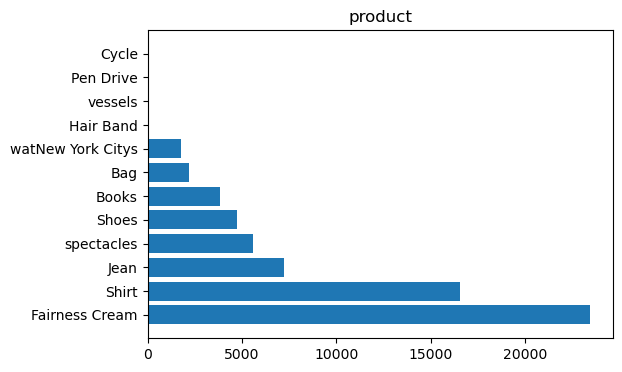

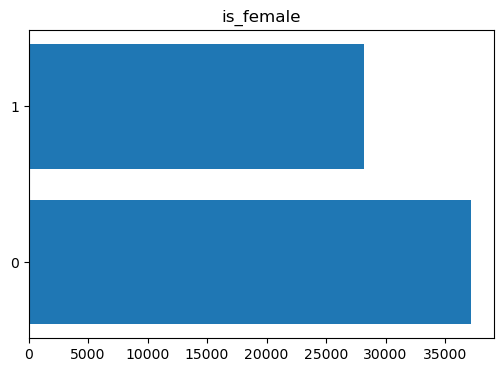

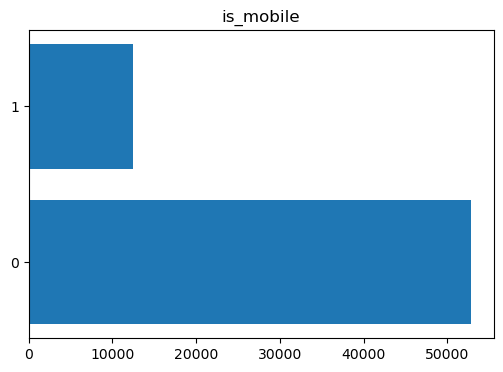

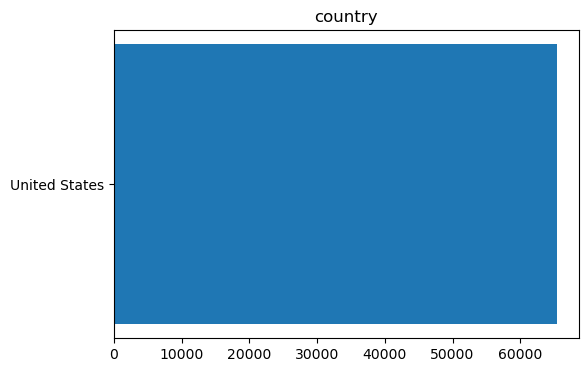

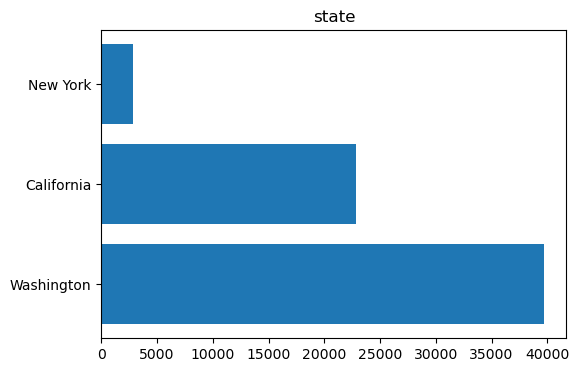

...

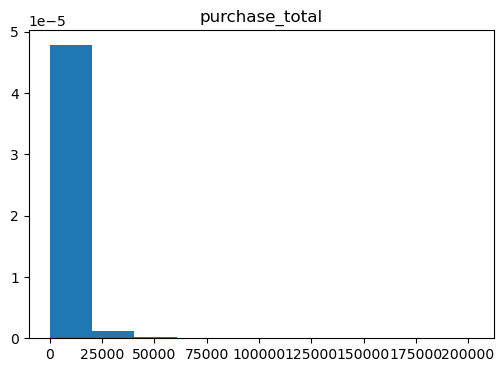

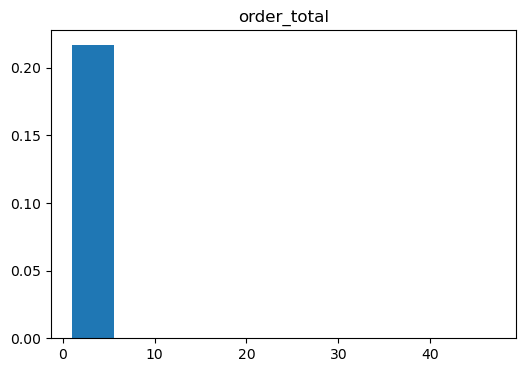

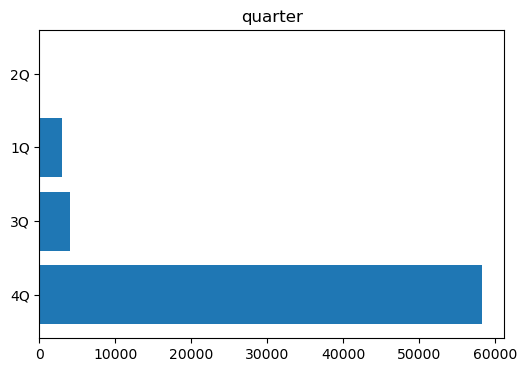

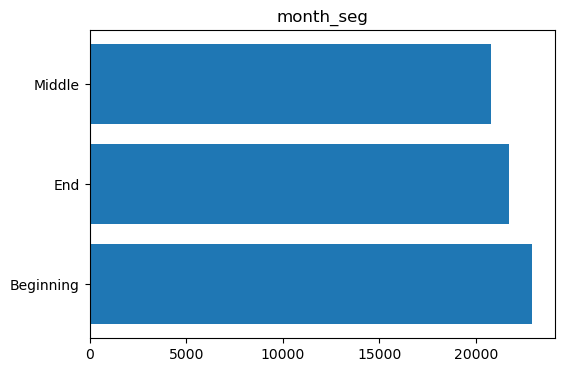

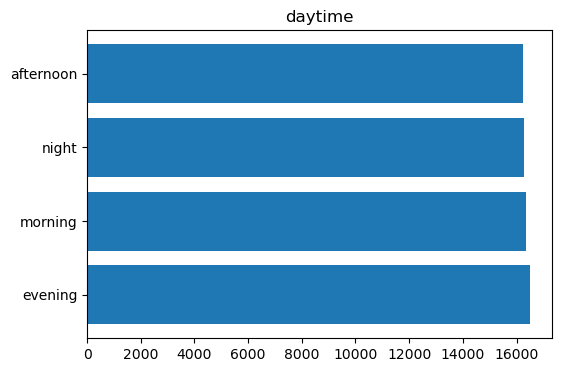

In [123]:
for col_name in df.columns:
    
    if col_name in cat_col:
        val_cnt = df[col_name].value_counts()
        plt.figure(figsize=(6, 4))
        xticks = val_cnt.index.astype(str)
        plt.barh(val_cnt.index, val_cnt.values, tick_label = xticks) # Prevent binary values to be plotted as continuos, numerical one on the x-axis.
        plt.title(col_name)
    elif col_name not in not_cat_col:
        plt.figure(figsize=(6, 4))
        plt.hist(df[col_name], density = True)
        # sns.histplot(data=df, x=col_name, kde=True)
        plt.title(col_name)

plt.show()

- With displots, probability distribution can be described at once.

/Users/misunsong/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/misunsong/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/misunsong/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with

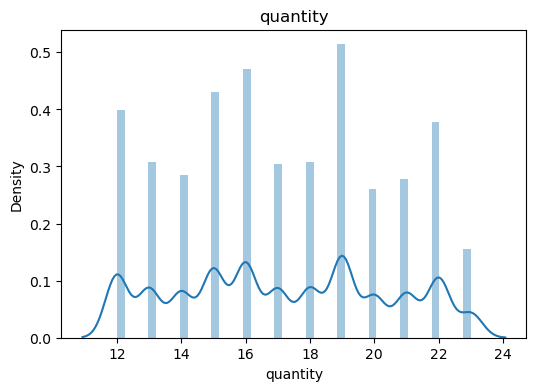

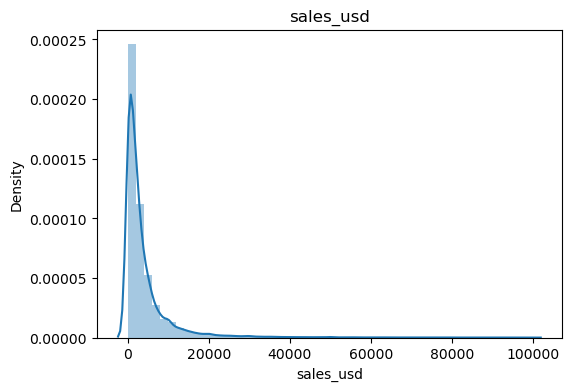

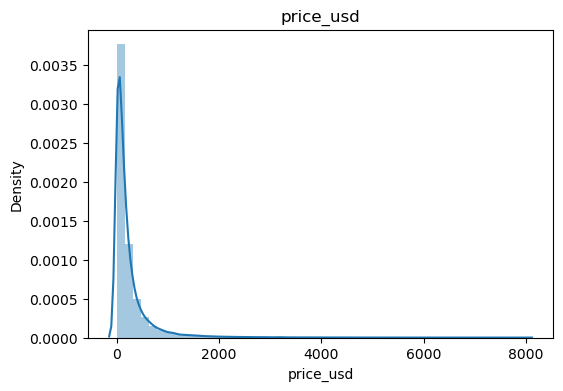

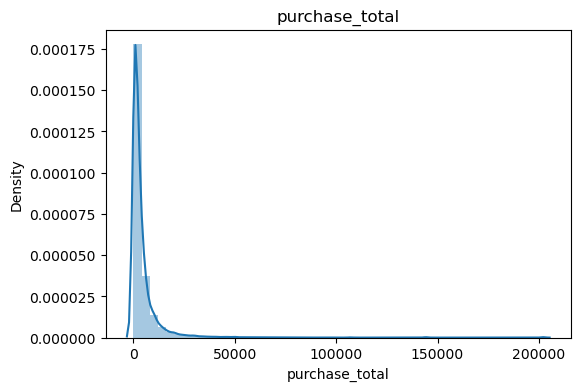

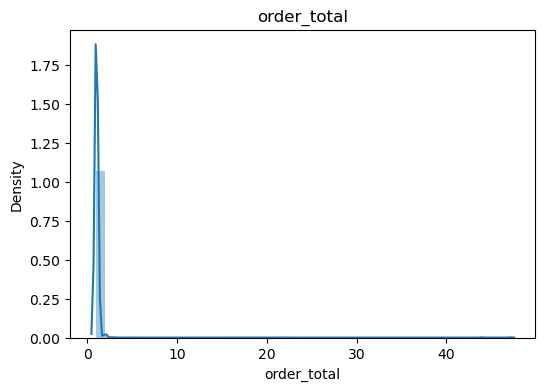

In [124]:
# Loop through column names
for col_name in df.columns:
    
    if col_name in num_col:
        plt.figure(figsize=(6, 4))
        sns.distplot(df[col_name])
        plt.title(col_name)

# Display the plots
plt.show()

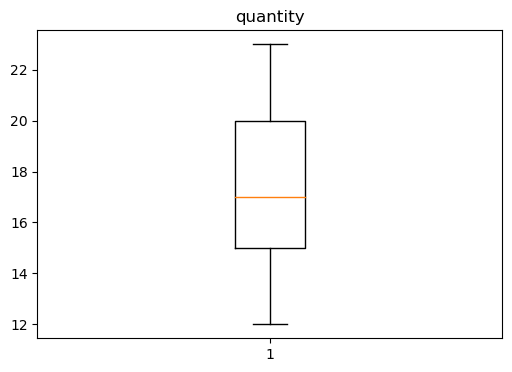

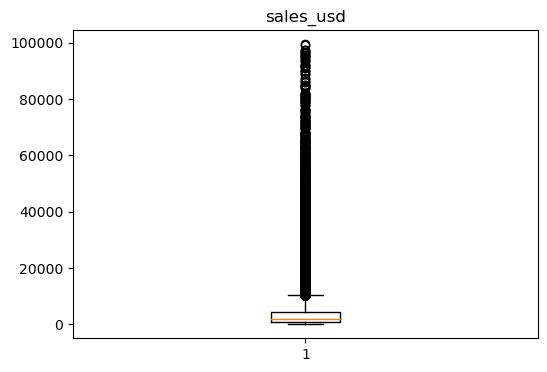

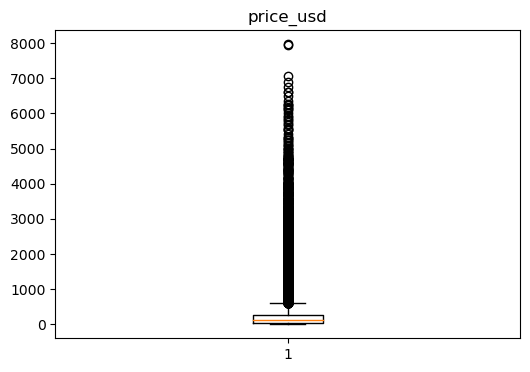

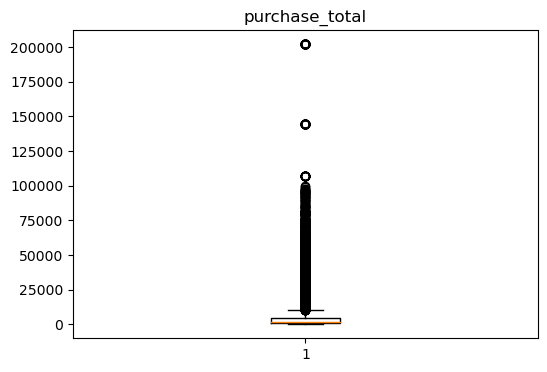

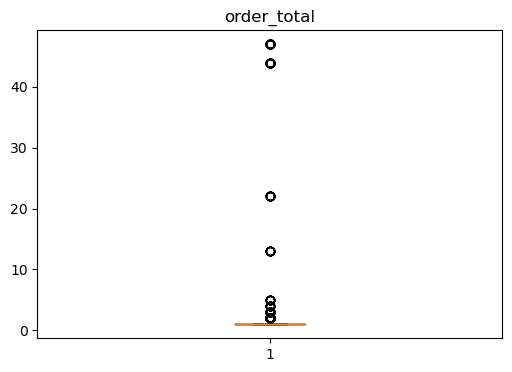

In [125]:
for col_name in df.columns:
    if col_name in num_col:
        plt.figure(figsize = (6, 4))
        plt.boxplot(df[col_name], whis = 1.5)
        plt.title(col_name)
        
plt.show()

In [126]:
box_cat = ['product', 'is_female', 'is_mobile', 'state', 'city', 'is_express', 'transaction_result', 'month', 'year', 'region', 'cat_group', 'is_fashion', 'member_class', 'quarter', 'month_seg', 'daytime']

In [127]:
df['product'].value_counts()

Fairness Cream       23464
Shirt                16527
Jean                  7216
spectacles            5592
Shoes                 4739
Books                 3810
Bag                   2185
watNew York Citys     1762
Hair Band               48
vessels                 20
Pen Drive               11
Cycle                    1
Name: product, dtype: int64

/var/folders/zt/7p4x8_1d2wdgdv8_dqk8gg080000gn/T/ipykernel_17445/829044483.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (6,4))


<Figure size 600x400 with 0 Axes>

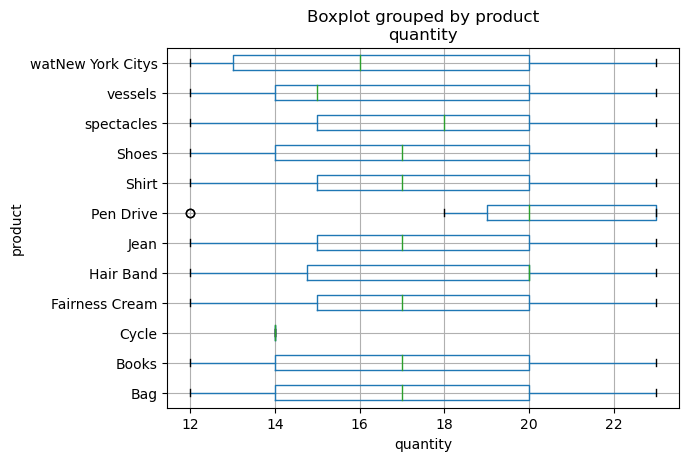

<Figure size 600x400 with 0 Axes>

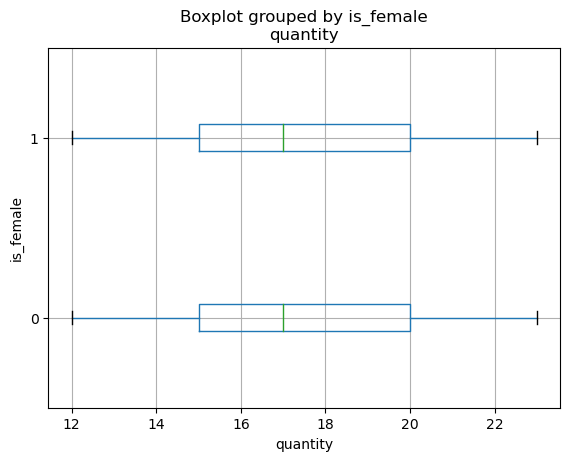

<Figure size 600x400 with 0 Axes>

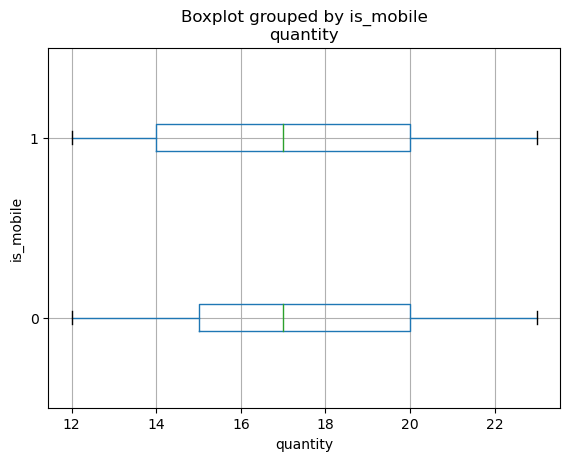

<Figure size 600x400 with 0 Axes>

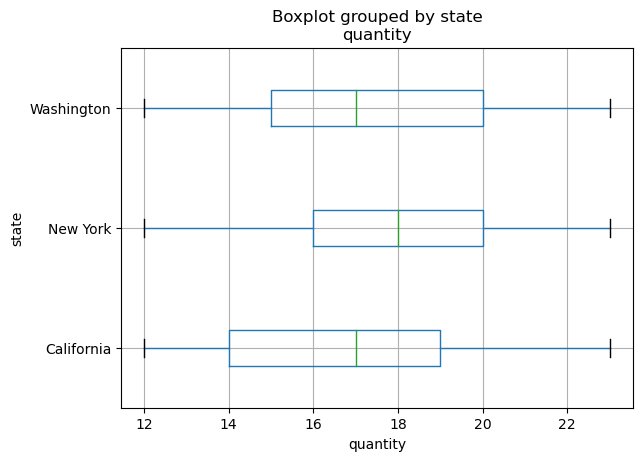

<Figure size 600x400 with 0 Axes>

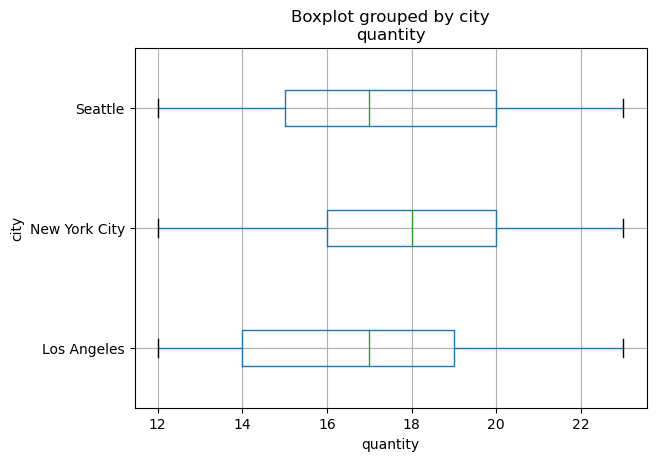

<Figure size 600x400 with 0 Axes>

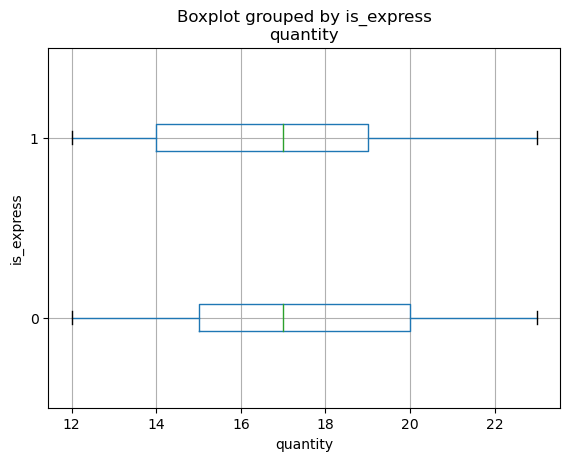

<Figure size 600x400 with 0 Axes>

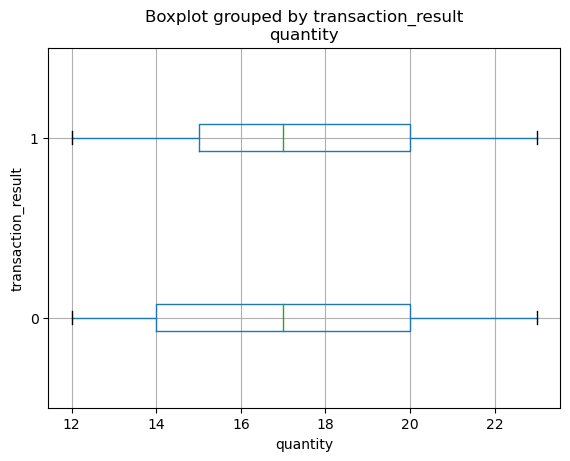

<Figure size 600x400 with 0 Axes>

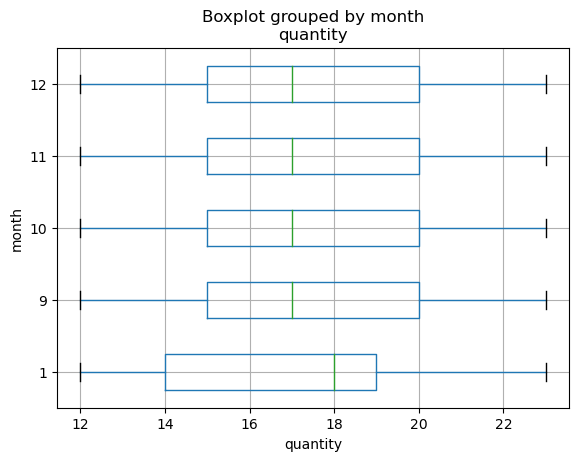

<Figure size 600x400 with 0 Axes>

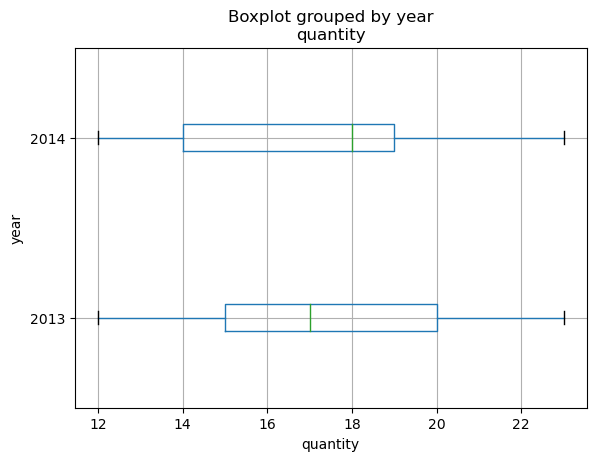

<Figure size 600x400 with 0 Axes>

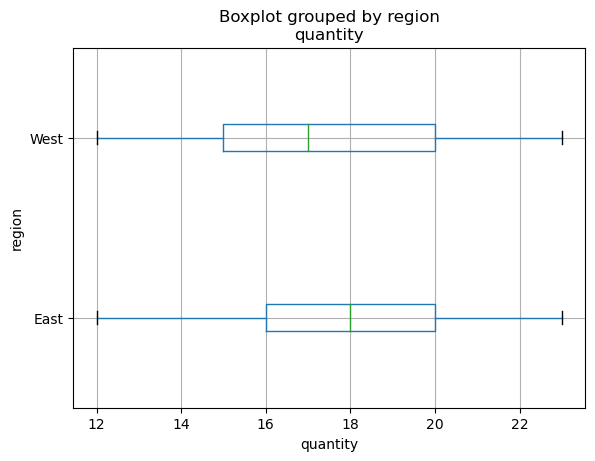

<Figure size 600x400 with 0 Axes>

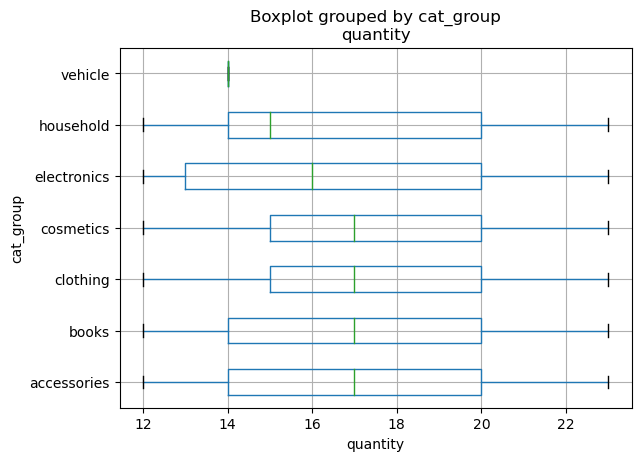

<Figure size 600x400 with 0 Axes>

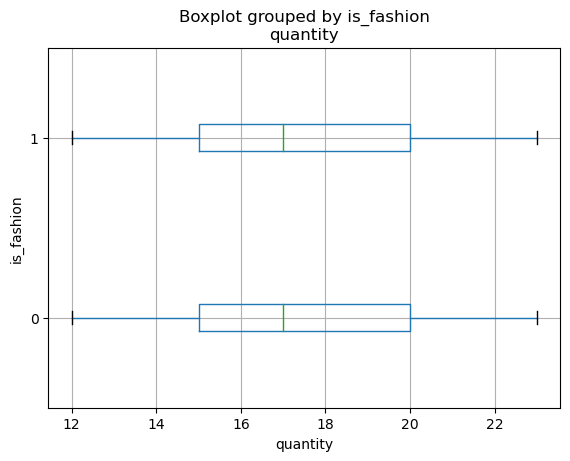

<Figure size 600x400 with 0 Axes>

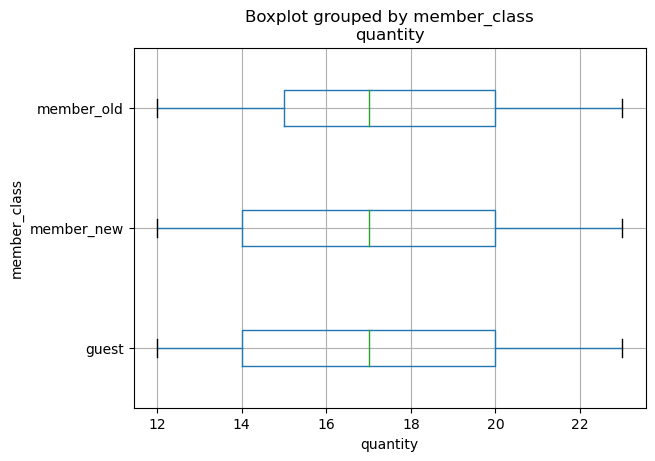

<Figure size 600x400 with 0 Axes>

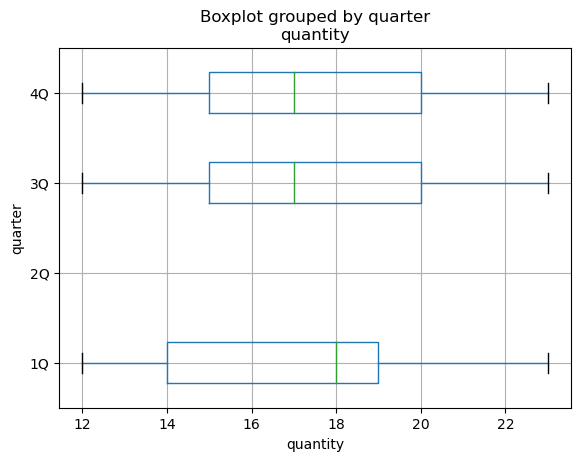

<Figure size 600x400 with 0 Axes>

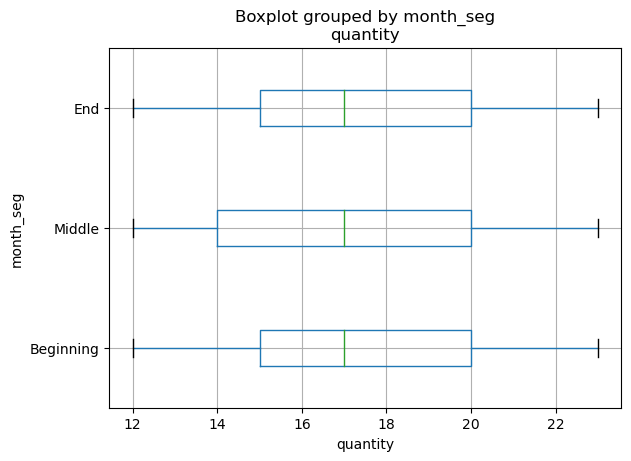

<Figure size 600x400 with 0 Axes>

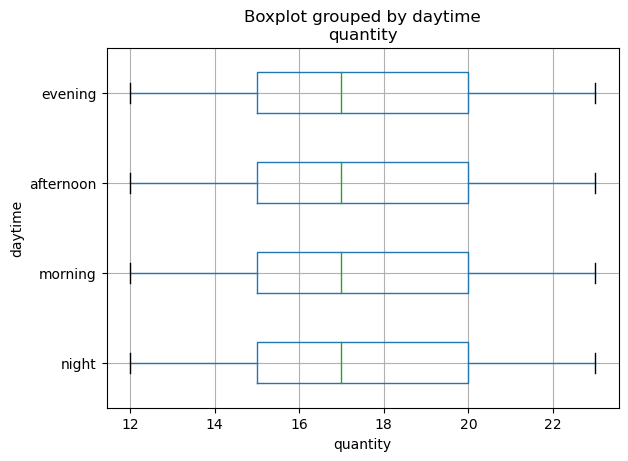

<Figure size 600x400 with 0 Axes>

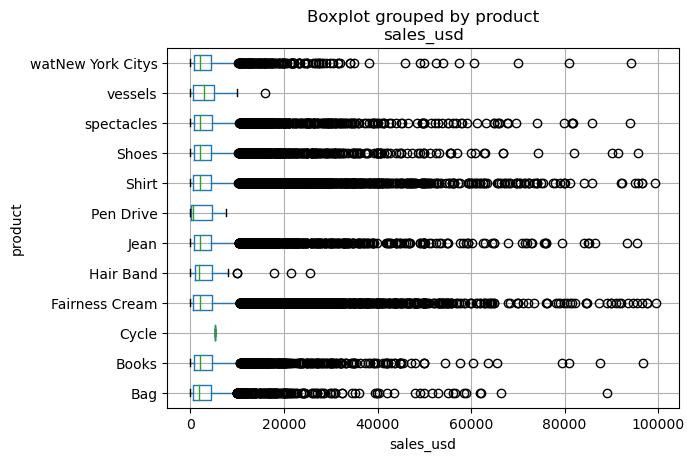

<Figure size 600x400 with 0 Axes>

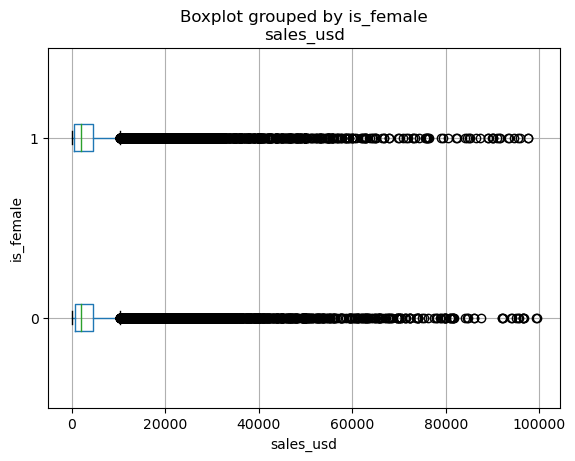

<Figure size 600x400 with 0 Axes>

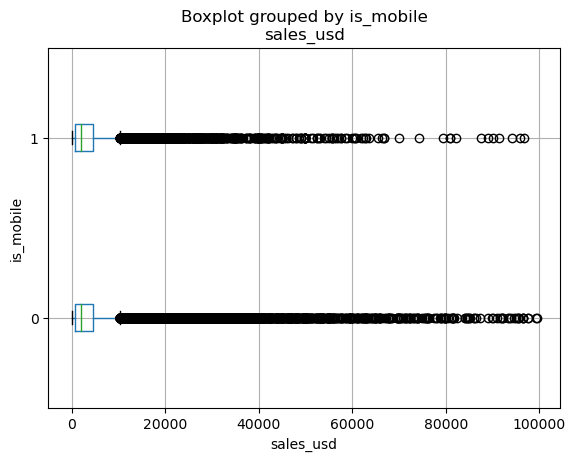

<Figure size 600x400 with 0 Axes>

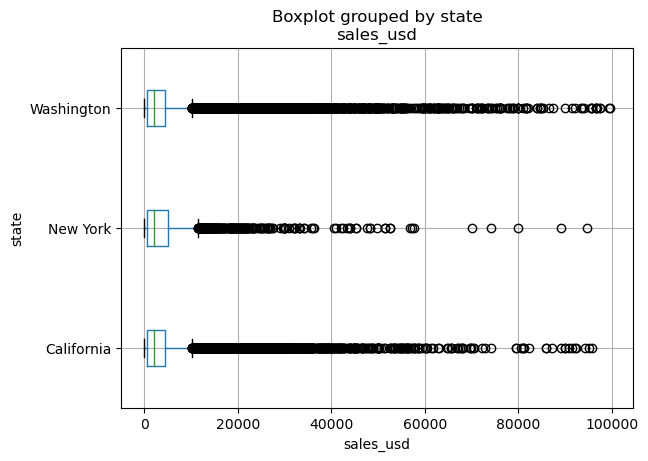

<Figure size 600x400 with 0 Axes>

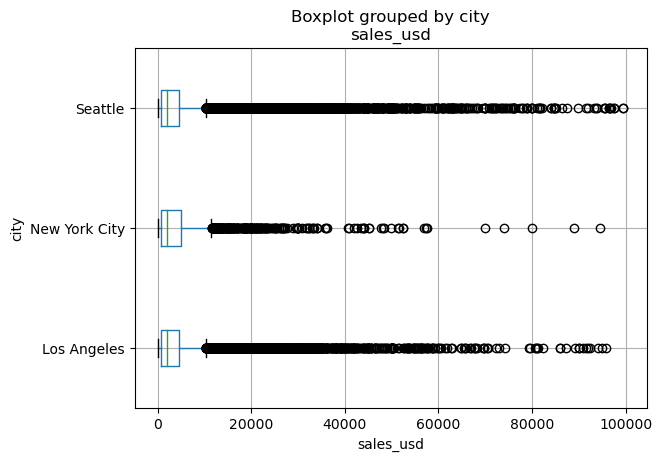

<Figure size 600x400 with 0 Axes>

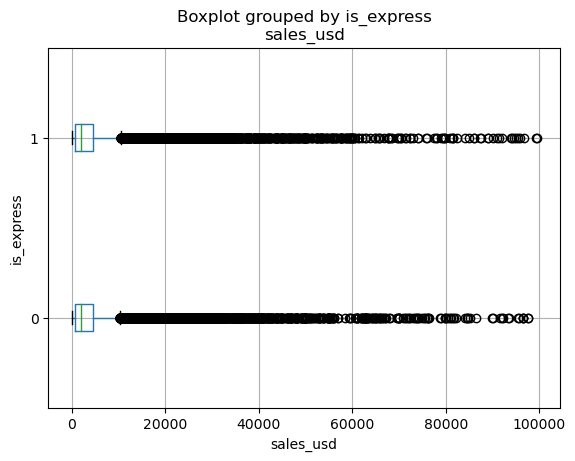

<Figure size 600x400 with 0 Axes>

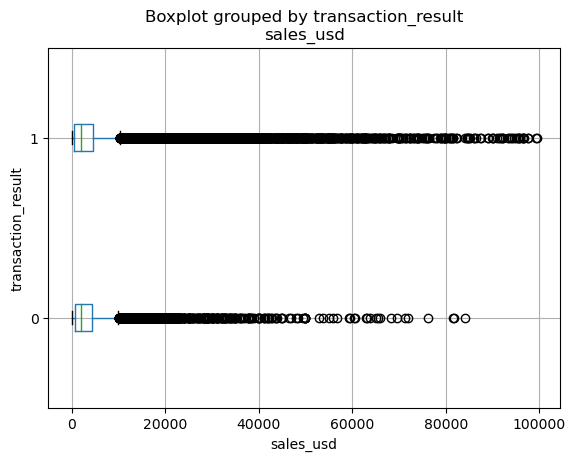

<Figure size 600x400 with 0 Axes>

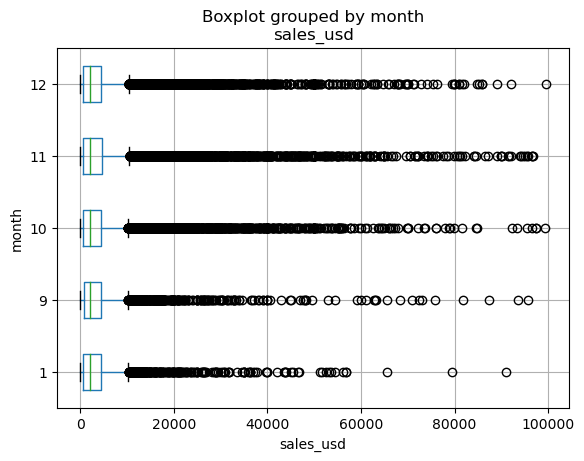

<Figure size 600x400 with 0 Axes>

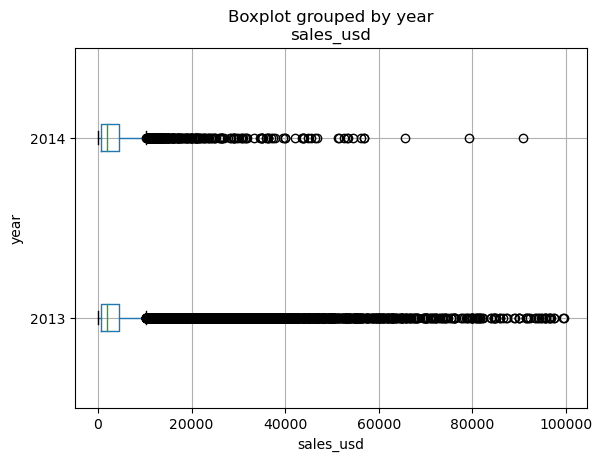

<Figure size 600x400 with 0 Axes>

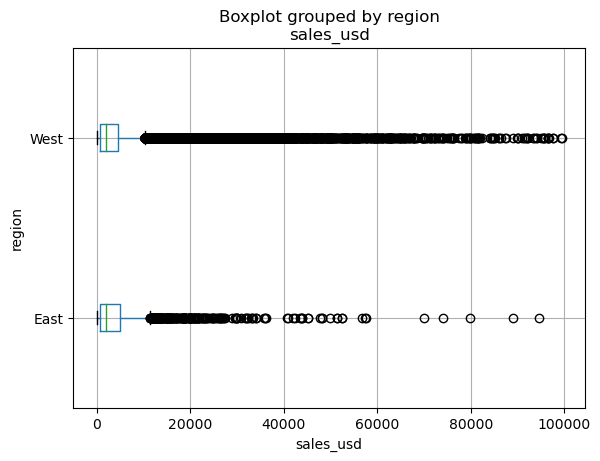

<Figure size 600x400 with 0 Axes>

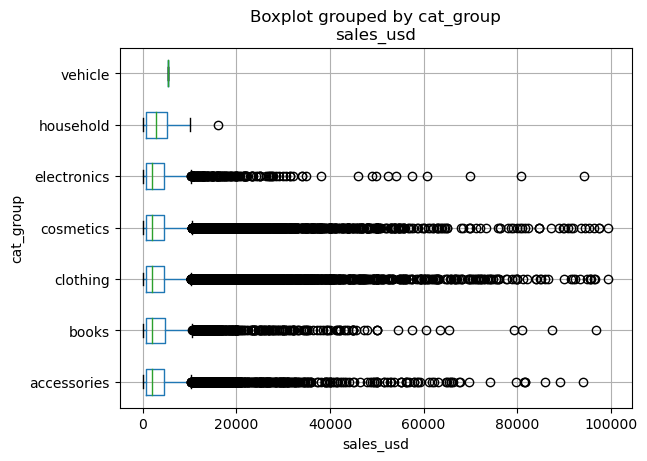

<Figure size 600x400 with 0 Axes>

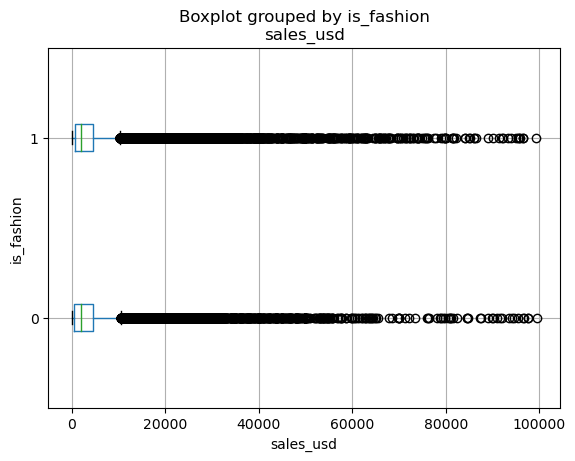

<Figure size 600x400 with 0 Axes>

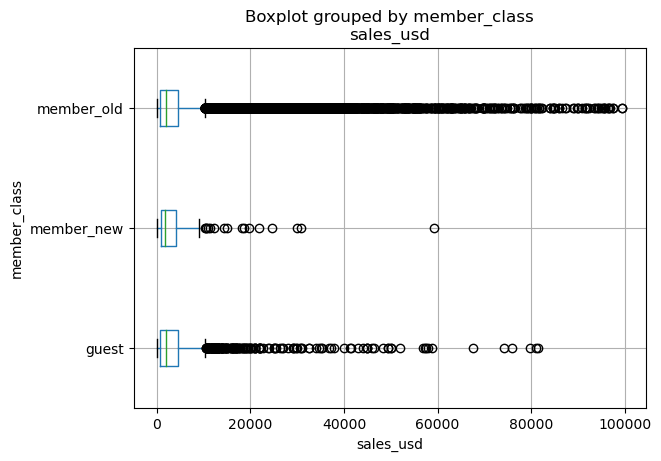

<Figure size 600x400 with 0 Axes>

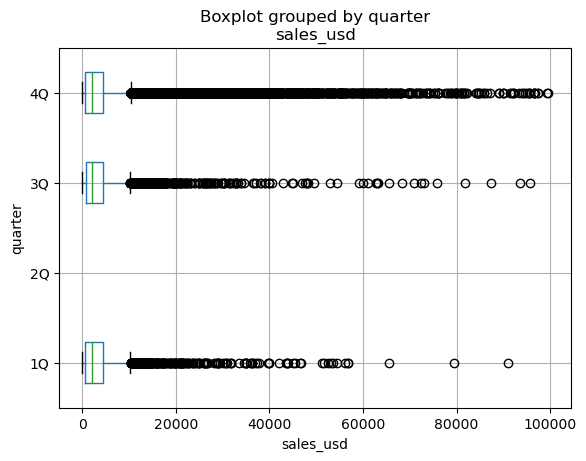

<Figure size 600x400 with 0 Axes>

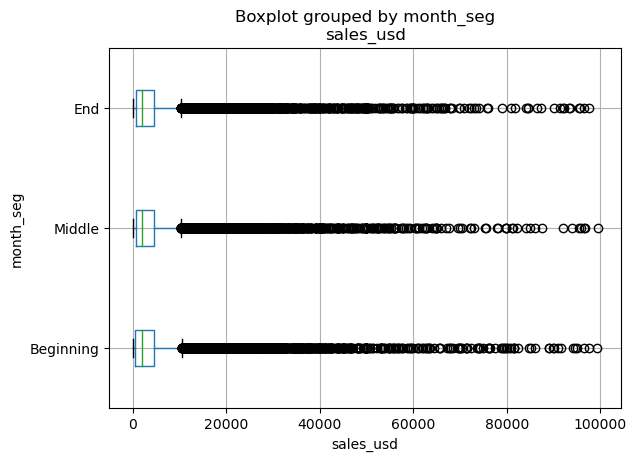

<Figure size 600x400 with 0 Axes>

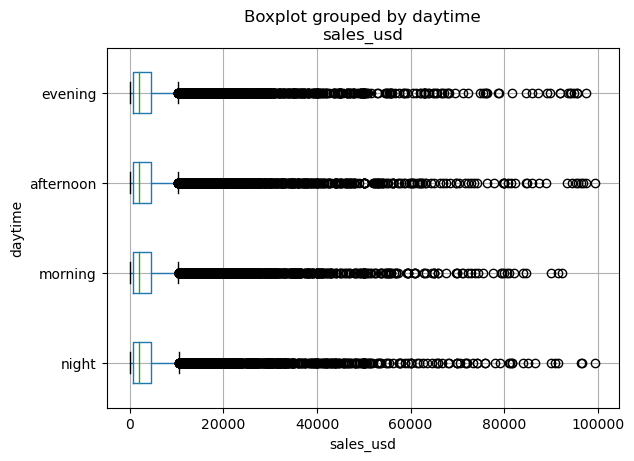

<Figure size 600x400 with 0 Axes>

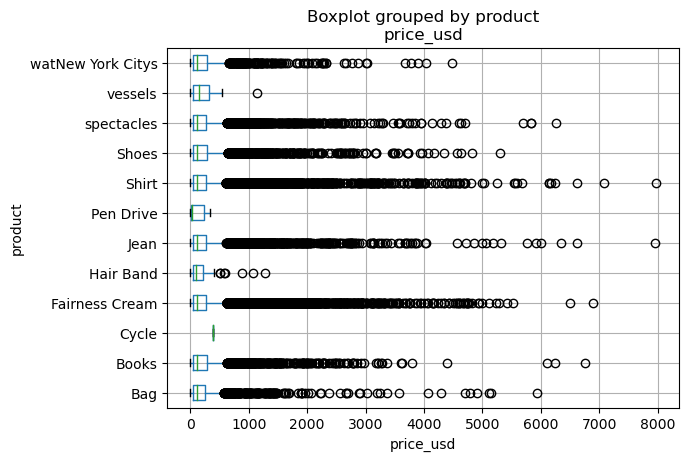

<Figure size 600x400 with 0 Axes>

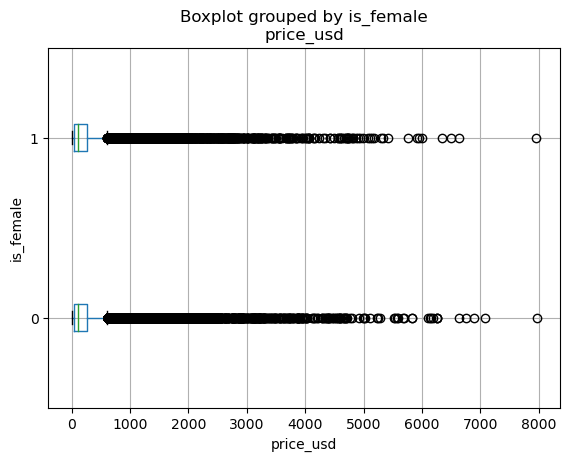

<Figure size 600x400 with 0 Axes>

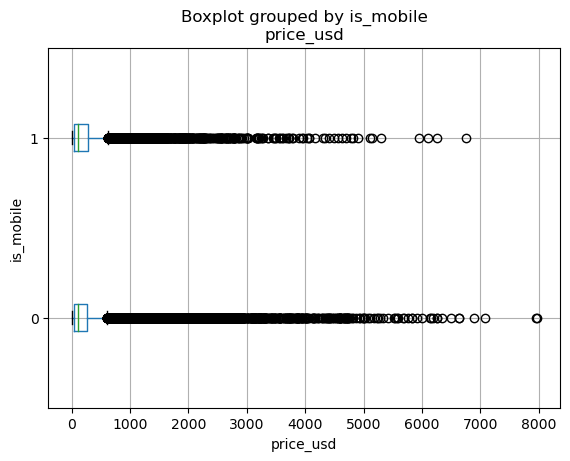

<Figure size 600x400 with 0 Axes>

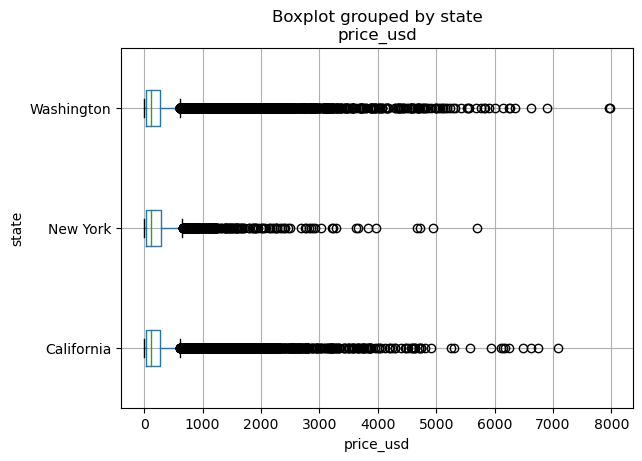

<Figure size 600x400 with 0 Axes>

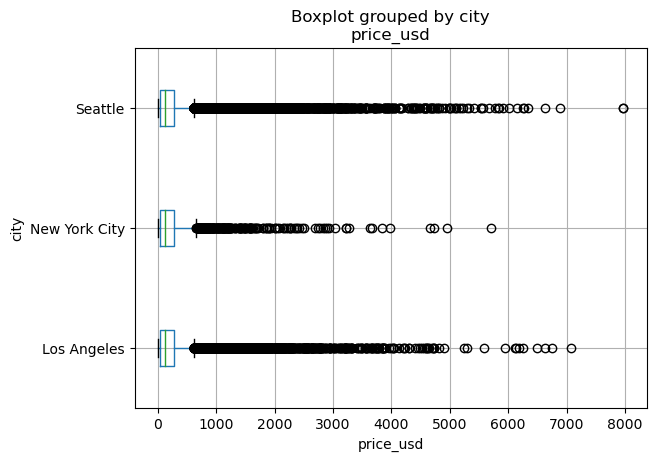

<Figure size 600x400 with 0 Axes>

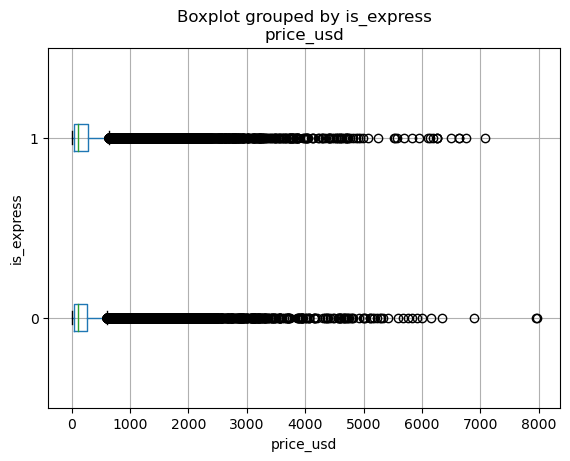

<Figure size 600x400 with 0 Axes>

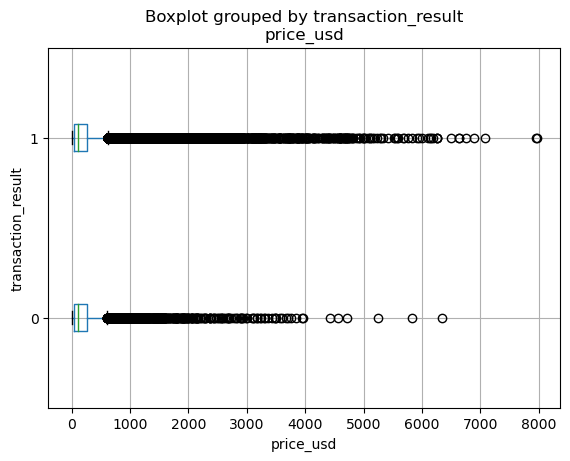

<Figure size 600x400 with 0 Axes>

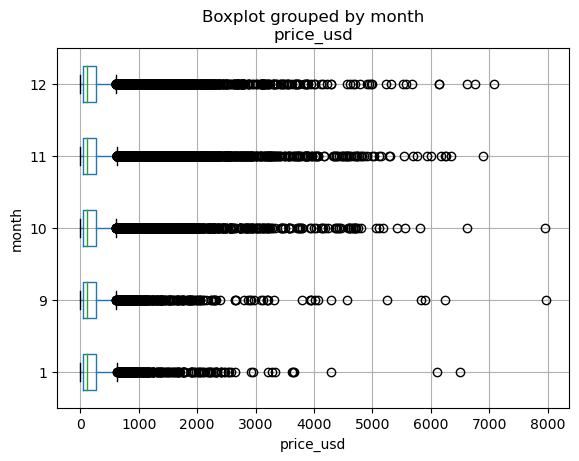

<Figure size 600x400 with 0 Axes>

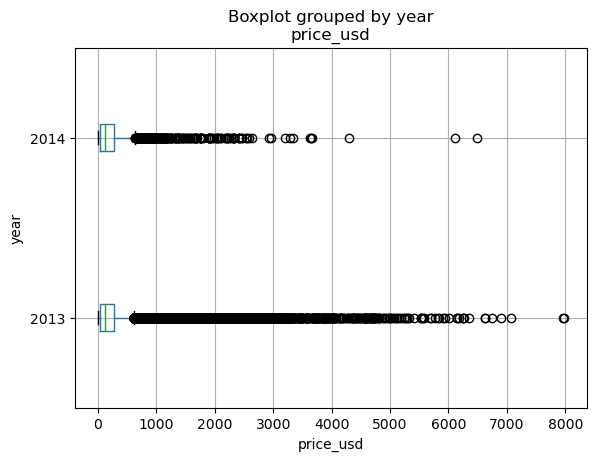

<Figure size 600x400 with 0 Axes>

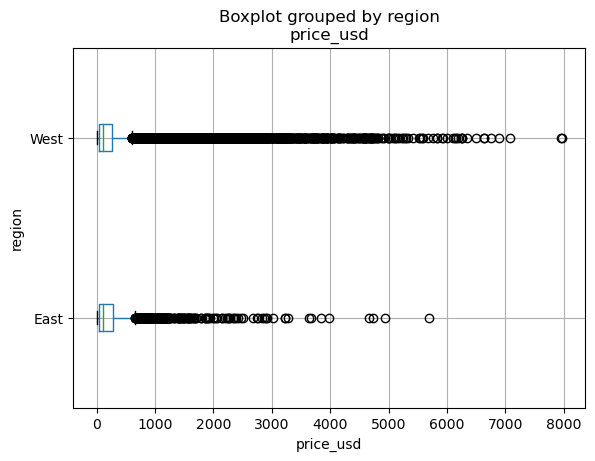

<Figure size 600x400 with 0 Axes>

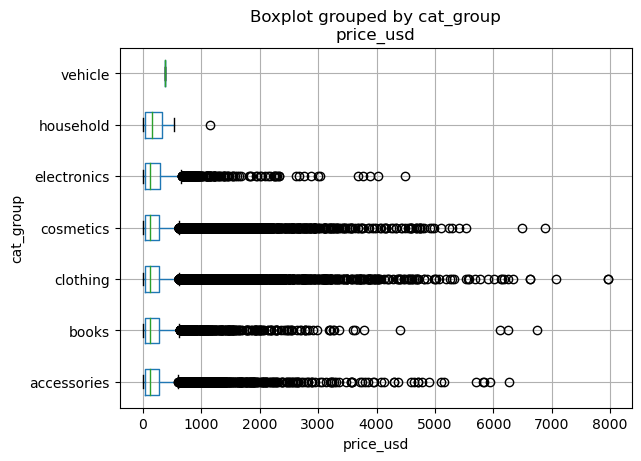

<Figure size 600x400 with 0 Axes>

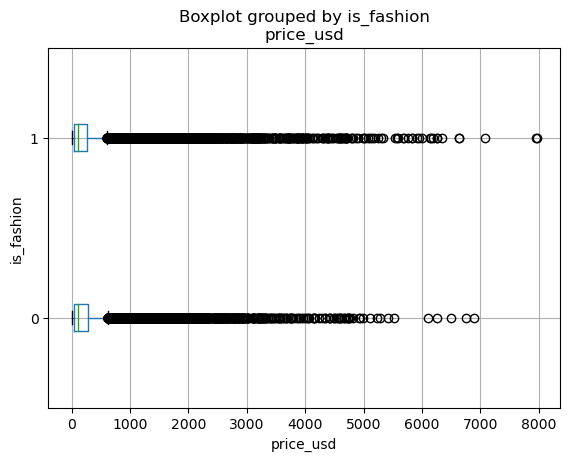

<Figure size 600x400 with 0 Axes>

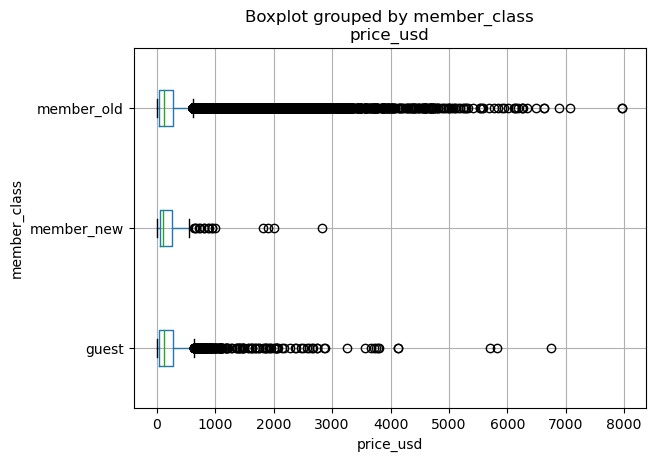

<Figure size 600x400 with 0 Axes>

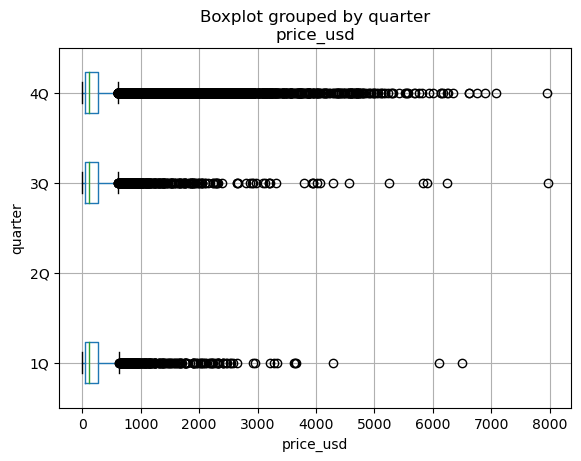

<Figure size 600x400 with 0 Axes>

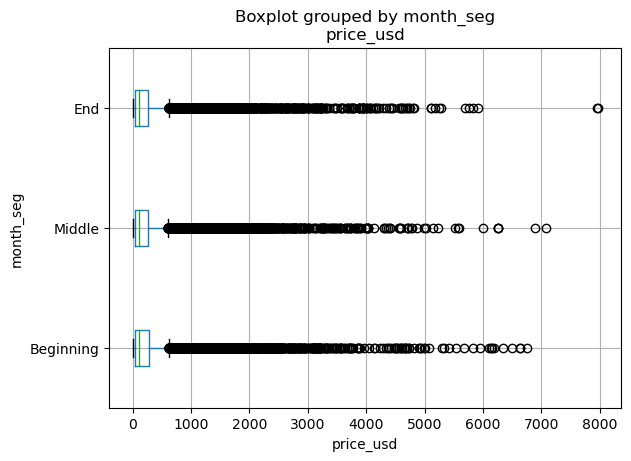

<Figure size 600x400 with 0 Axes>

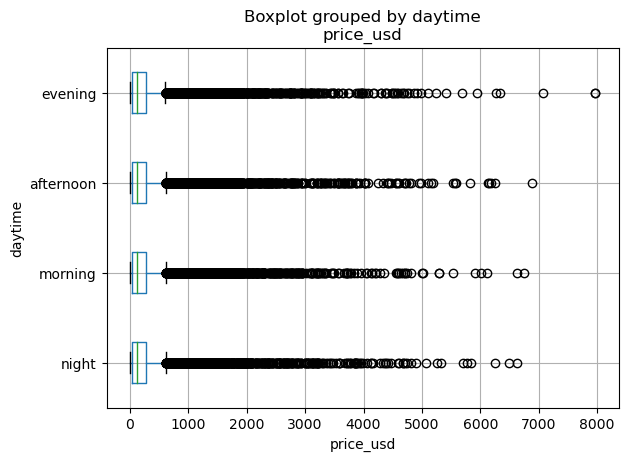

<Figure size 600x400 with 0 Axes>

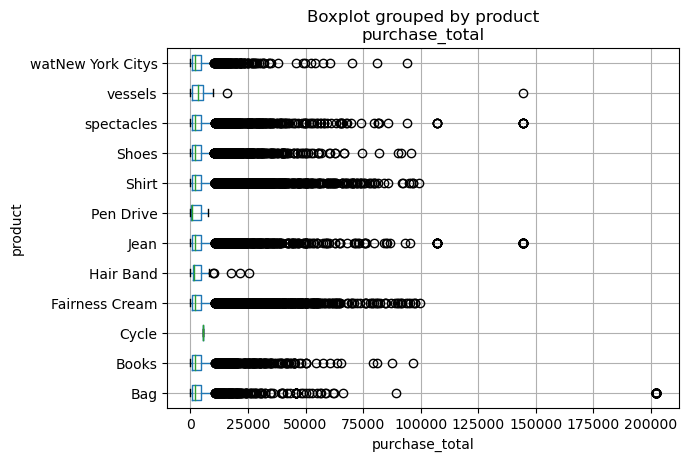

<Figure size 600x400 with 0 Axes>

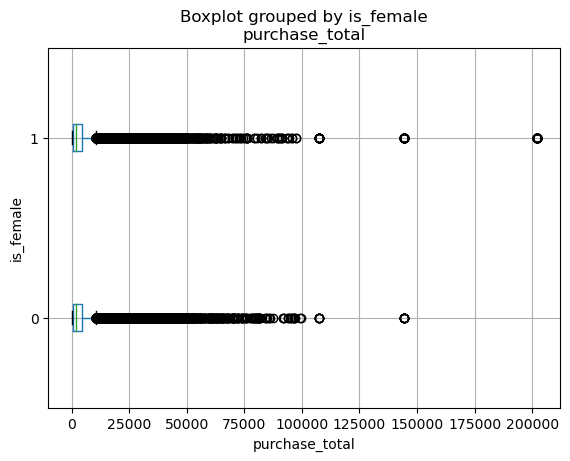

<Figure size 600x400 with 0 Axes>

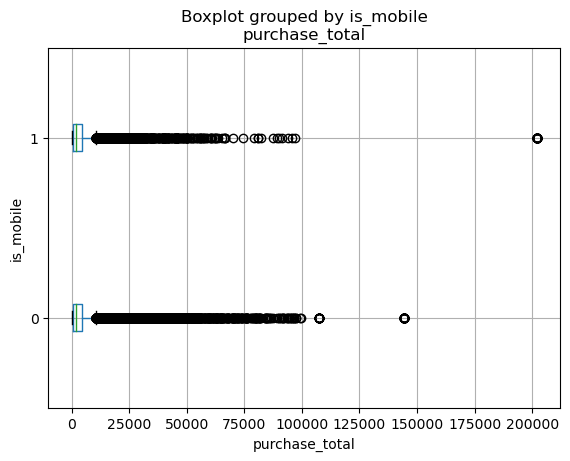

<Figure size 600x400 with 0 Axes>

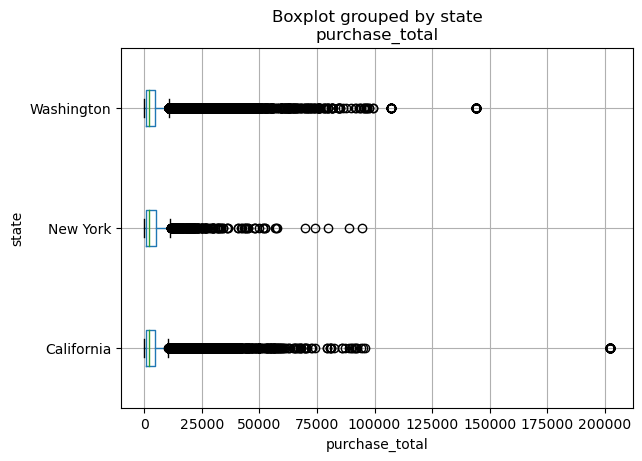

<Figure size 600x400 with 0 Axes>

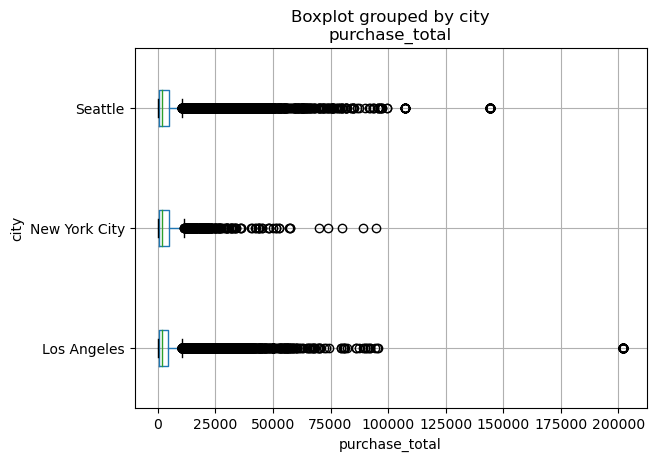

<Figure size 600x400 with 0 Axes>

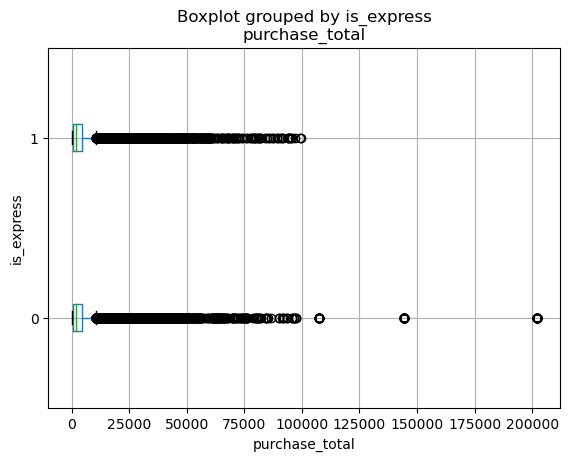

<Figure size 600x400 with 0 Axes>

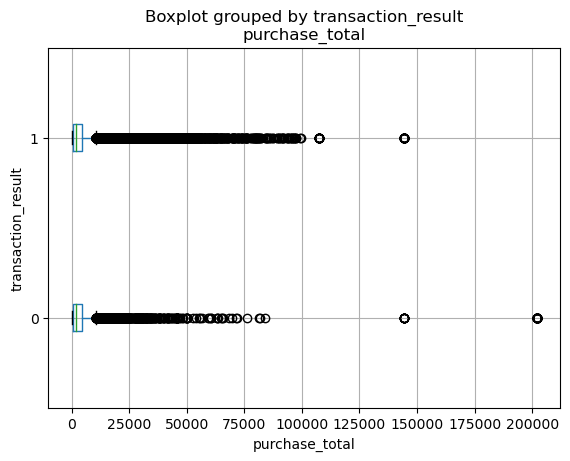

<Figure size 600x400 with 0 Axes>

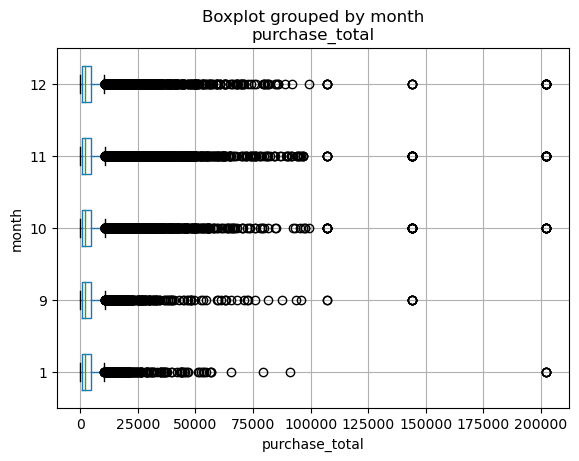

<Figure size 600x400 with 0 Axes>

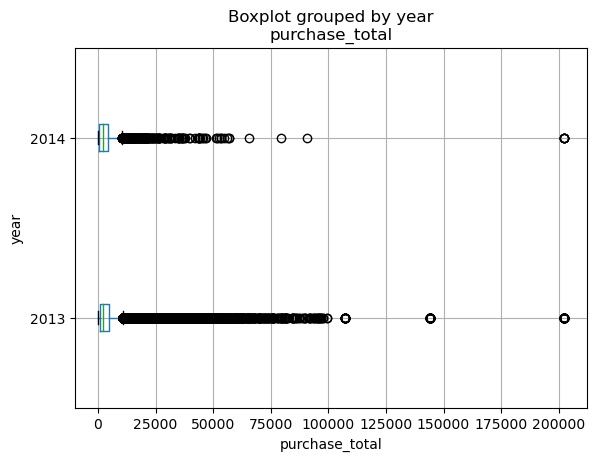

<Figure size 600x400 with 0 Axes>

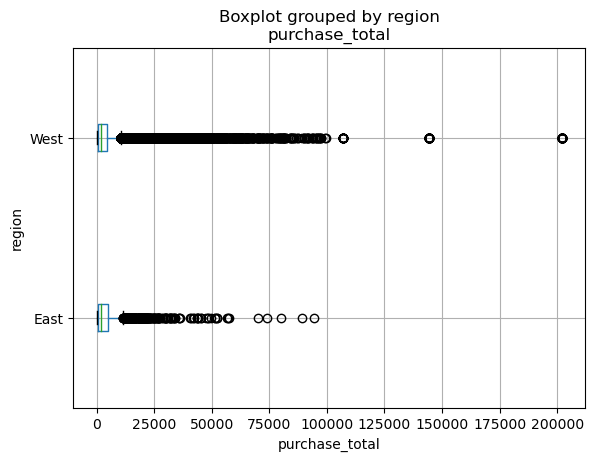

<Figure size 600x400 with 0 Axes>

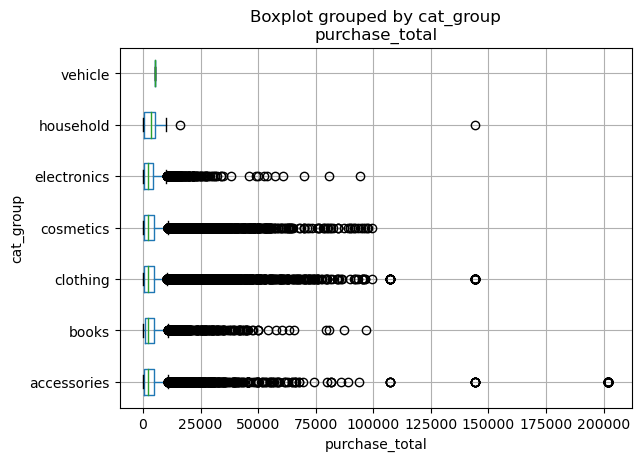

<Figure size 600x400 with 0 Axes>

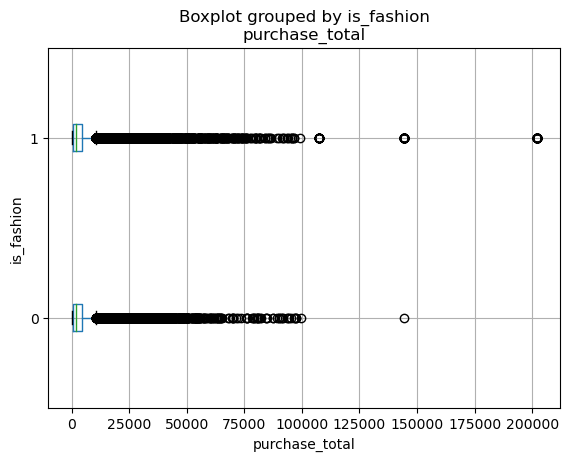

<Figure size 600x400 with 0 Axes>

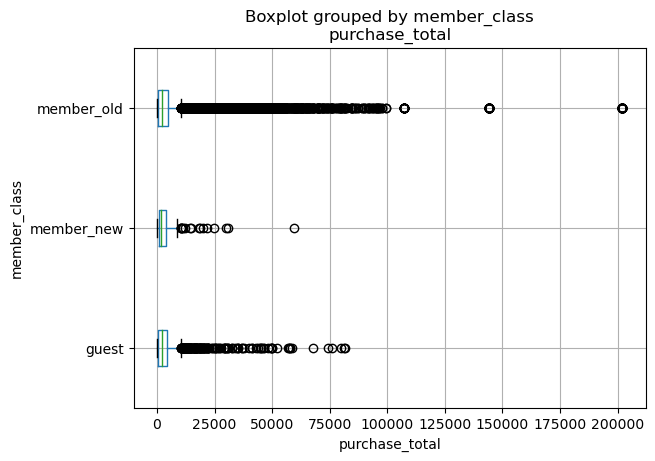

<Figure size 600x400 with 0 Axes>

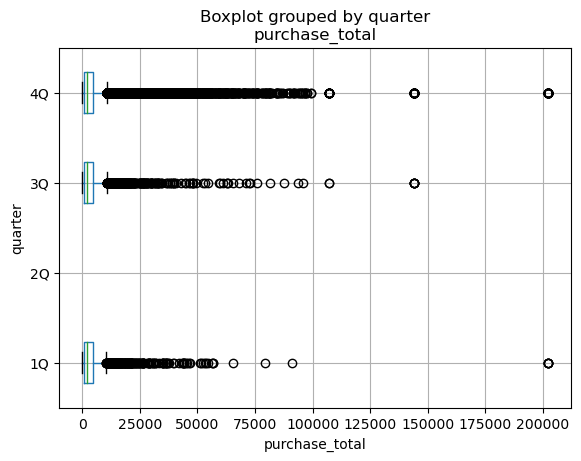

<Figure size 600x400 with 0 Axes>

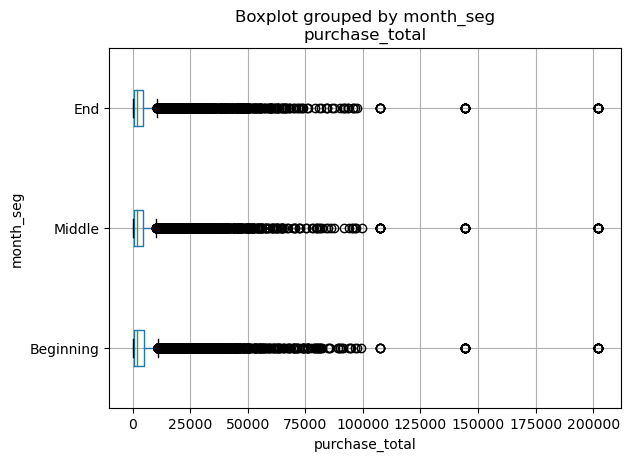

<Figure size 600x400 with 0 Axes>

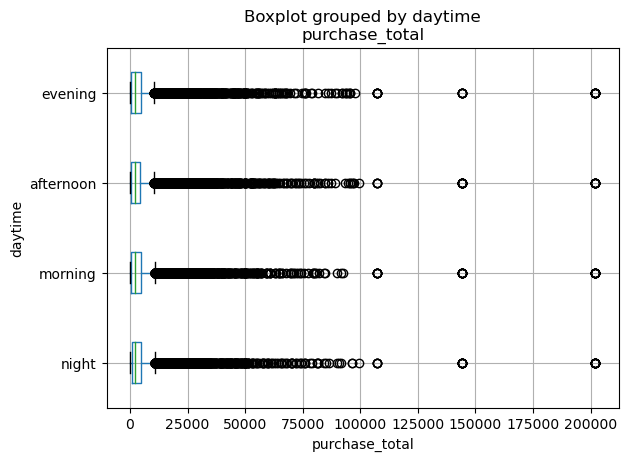

<Figure size 600x400 with 0 Axes>

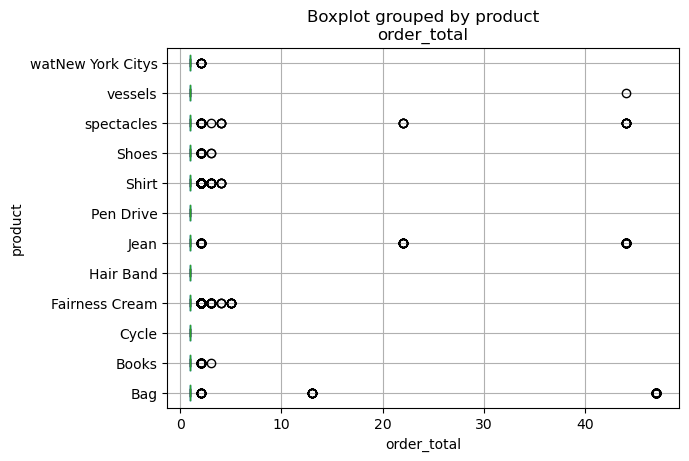

<Figure size 600x400 with 0 Axes>

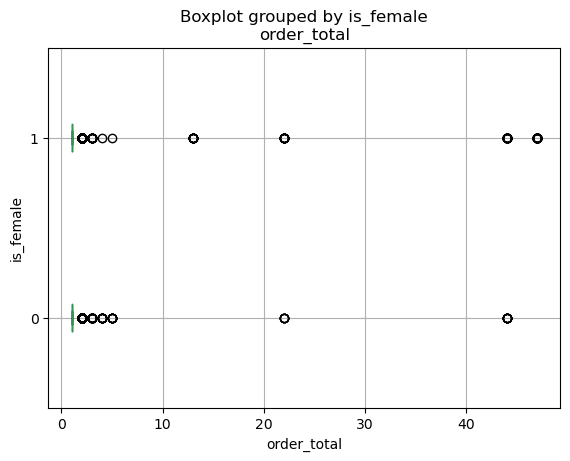

<Figure size 600x400 with 0 Axes>

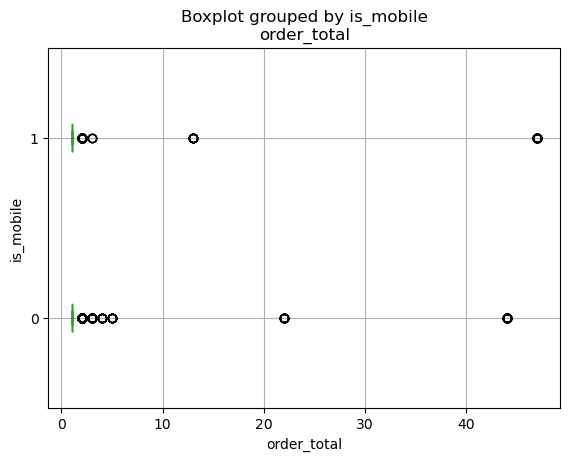

<Figure size 600x400 with 0 Axes>

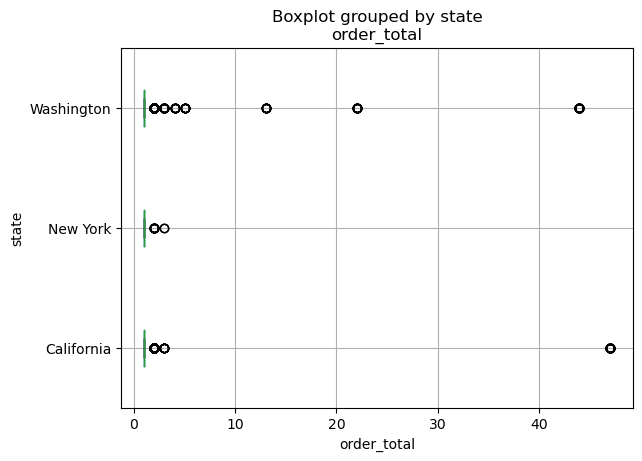

<Figure size 600x400 with 0 Axes>

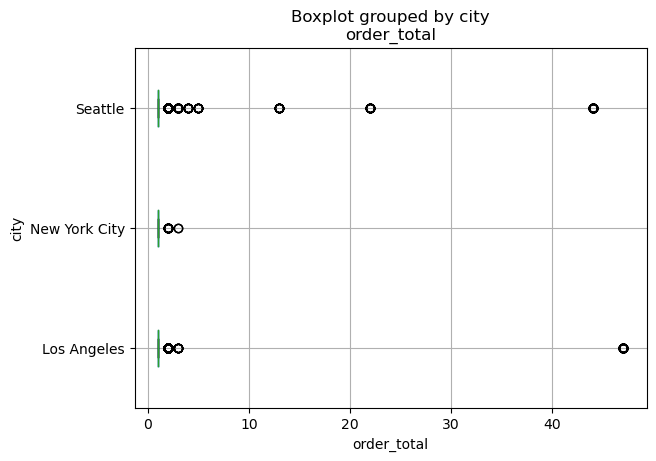

<Figure size 600x400 with 0 Axes>

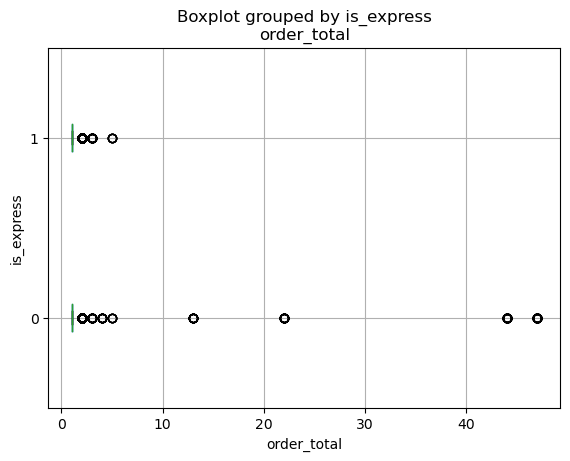

<Figure size 600x400 with 0 Axes>

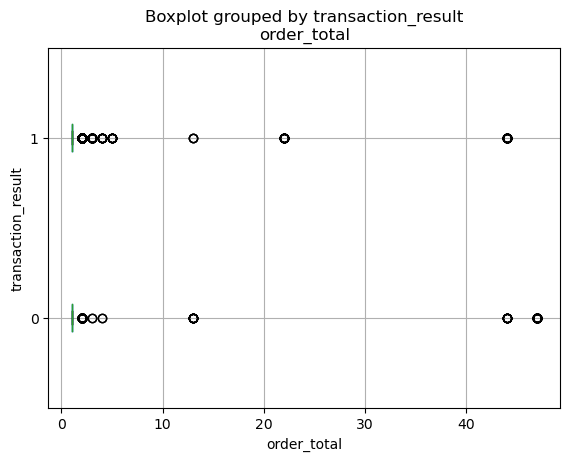

<Figure size 600x400 with 0 Axes>

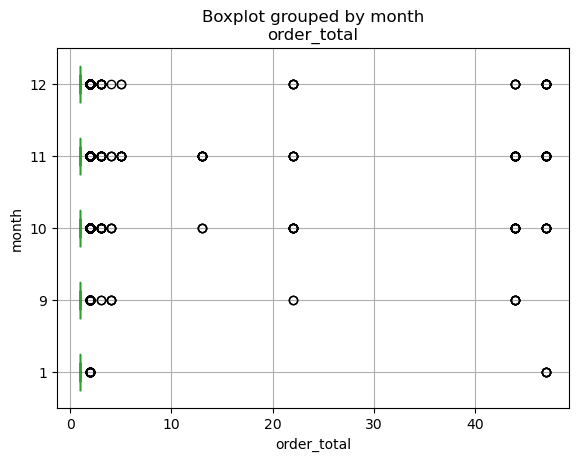

<Figure size 600x400 with 0 Axes>

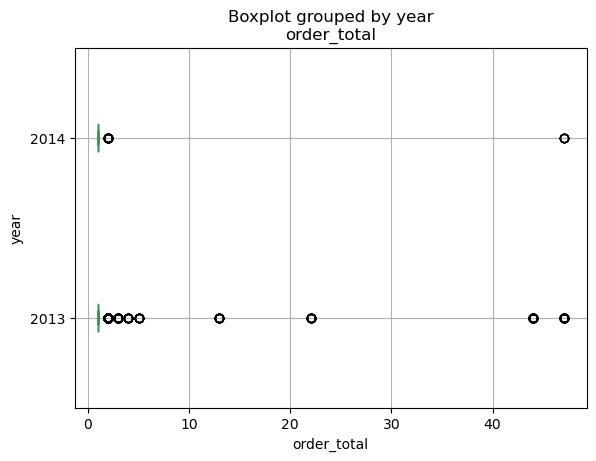

<Figure size 600x400 with 0 Axes>

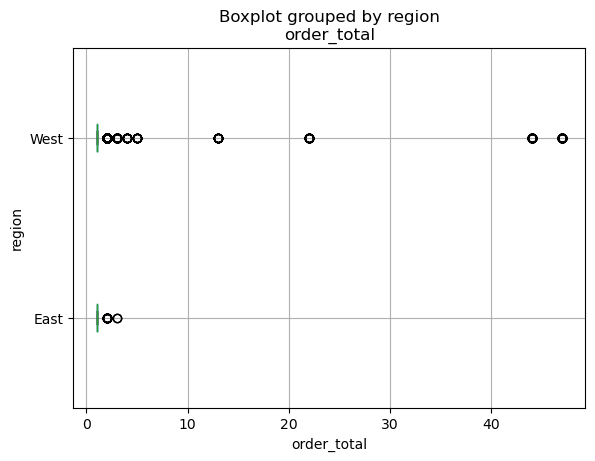

<Figure size 600x400 with 0 Axes>

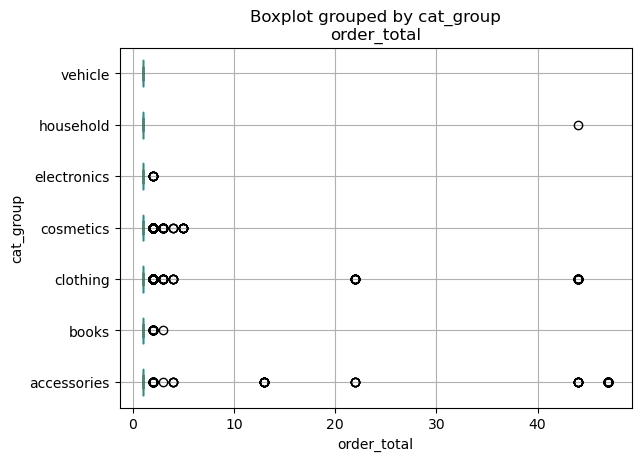

<Figure size 600x400 with 0 Axes>

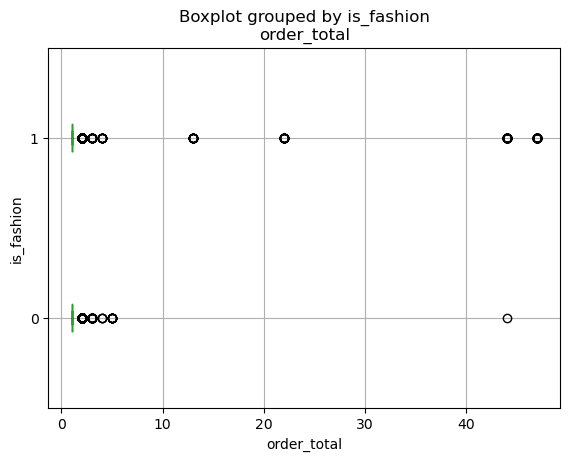

<Figure size 600x400 with 0 Axes>

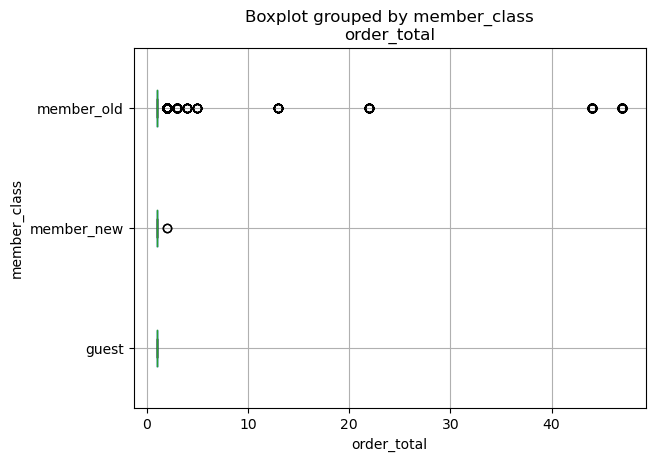

<Figure size 600x400 with 0 Axes>

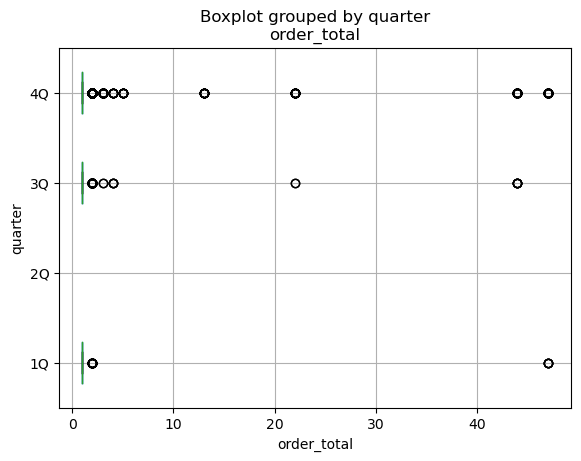

<Figure size 600x400 with 0 Axes>

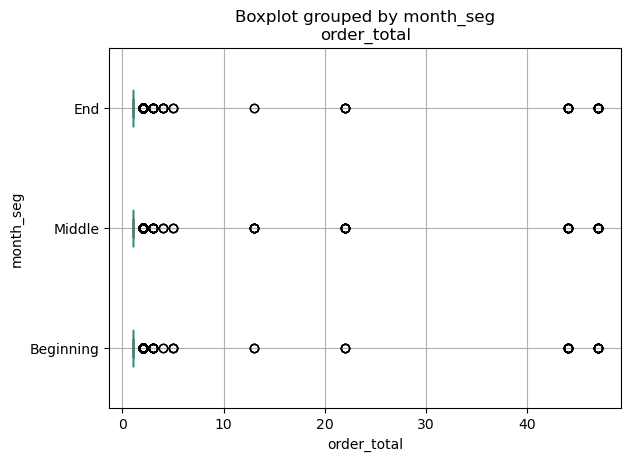

<Figure size 600x400 with 0 Axes>

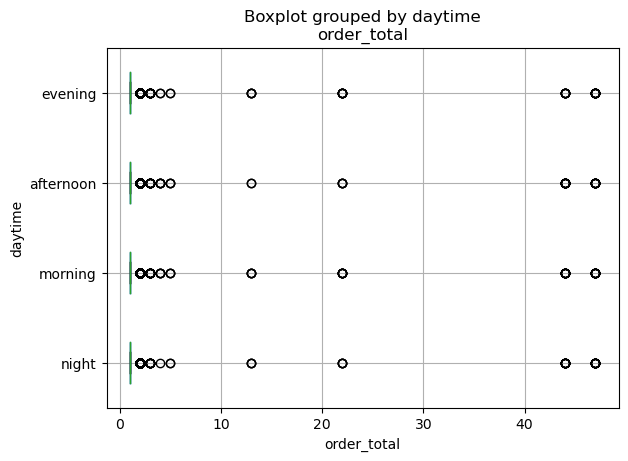

In [128]:
for num_col_name in num_col:
    for cat_col_name in box_cat:
        plt.figure(figsize = (6,4))
        df.boxplot(column = num_col_name, by = cat_col_name, vert = False) # True as the original frame false as the roatated frame
        plt.ylabel(cat_col_name) # Note the general x and y labels' location should be changed if roated
        plt.xlabel(num_col_name)
        
plt.show()

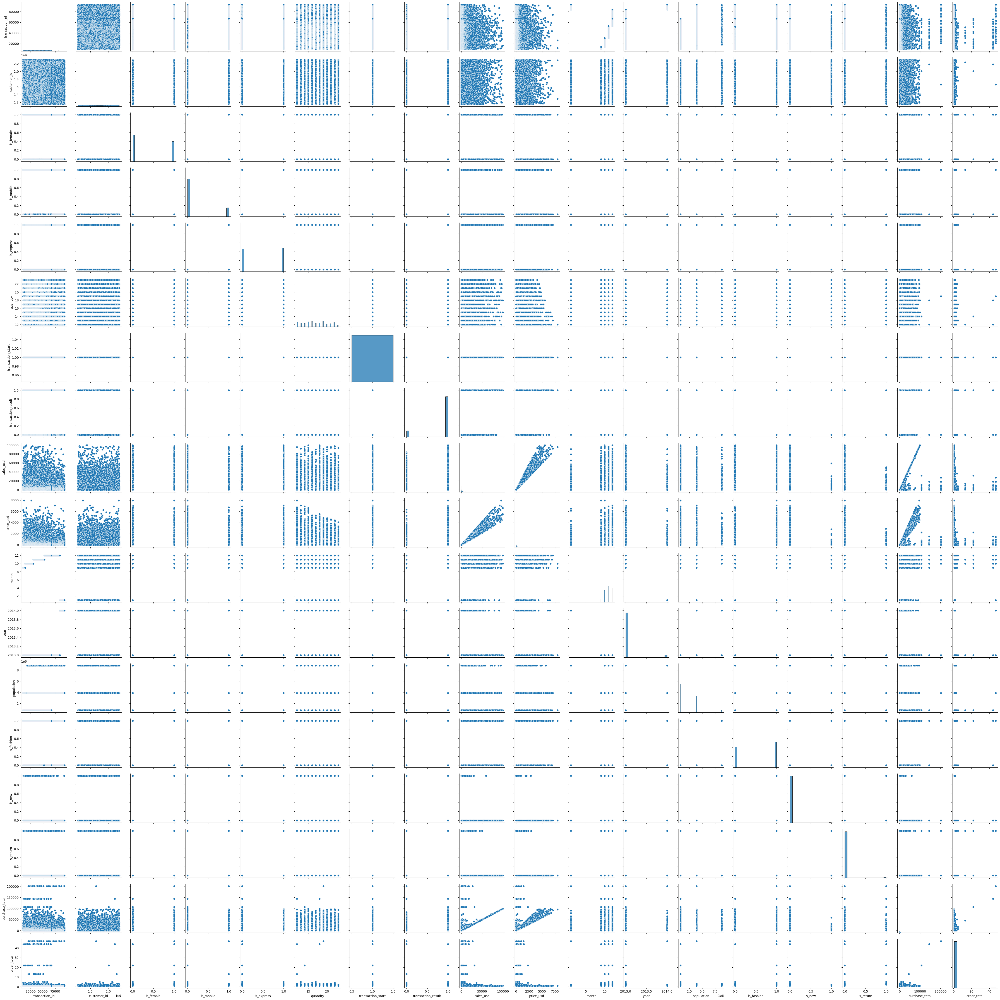

In [129]:
sns.pairplot(df) # hue='column_name'
plt.show() 

In [130]:
df_num = df[num_col]
df_num_corr = df_num.corr(method = 'pearson')
df_num_corr

,quantity,sales_usd,price_usd,purchase_total,order_total
quantity,1.000000,0.007037,-0.103179,-0.006568,-0.021650
sales_usd,0.007037,1.000000,0.974765,0.724942,-0.001124
price_usd,-0.103179,0.974765,1.000000,0.707703,0.001057
purchase_total,-0.006568,0.724942,0.707703,1.000000,0.676436
order_total,-0.021650,-0.001124,0.001057,0.676436,1.000000


<AxesSubplot:>

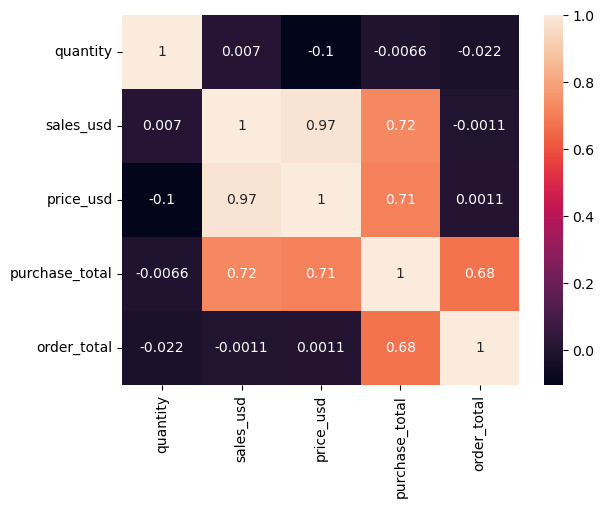

In [131]:
sns.heatmap(df_num_corr, annot = True)

In [132]:
!pip install pandas-profiling

In [133]:
from pandas_profiling import ProfileReport

/Users/misunsong/opt/anaconda3/lib/python3.9/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/Users/misunsong/opt/anaconda3/lib/python3.9/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:
/var/folders/zt/7p4x8_1d2wdgdv8_dqk8gg080000gn/T/ipykernel_17445/2274191625.py:1: DeprecationWarning: `import pandas_

- When you execute ProfileReport(df) in Python using a library like pandas_profiling, it generates a comprehensive report that includes correlations between variables, even for categorical variables. This is possible because ProfileReport internally uses various statistical methods and algorithms to analyze the data and identify potential relationships.
- On the other hand, when you use .corr in Python's pandas library, it calculates the correlation matrix specifically for numerical variables. The .corr method computes pairwise correlation coefficients between numerical columns, excluding any categorical variables.

In [134]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]